## UNet 
- flip_crop_lossの改善版
- まずは先ほどまで学習させたモデルを進ませる。
- 途中経過の画像をカラーマップで表示させたい
- 学習経過のlossを対数で表示させる
- lr=0.002 
- 10epoch目標
- 事前学習 ←　これはなしで
- dropout層の追加
- 活性化関数をシグモイドに変更
- loss関数をBCE
- optimizerはAdam
- normalizeはなし
- random brightを入れる
- validationの損失が下がらなくなったら少しだけ学習率を下げる

In [1]:
import cv2

from matplotlib import pyplot as plt
import matplotlib.cm as cm 

import numpy as np
import os
import pandas as pd

import torch
import torch.nn as nn
import torch.utils as utils
import torch.nn.init as init
import torch.utils.data as data
import torchvision.utils as v_utils
import torchvision.transforms as transforms
from torch.autograd import Variable
from torch.utils.data import Dataset
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

from sklearn.model_selection import train_test_split

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../"))
import random

import gc 
import sys

# Any results you write to the current directory are saved as output.

['AirbusShipDetection-MaskRCNN', 'AirbusShipDetection-Unet', 'test', 'train', 'train_ship_segmentations.csv']


In [2]:
%matplotlib inline 

In [3]:
masks = pd.read_csv("../train_ship_segmentations.csv")
masks.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
2,00021ddc3.jpg,101361 1 102128 3 102896 4 103663 6 104430 9 1...
3,00021ddc3.jpg,95225 2 95992 5 96760 7 97527 9 98294 9 99062 ...
4,00021ddc3.jpg,74444 4 75212 4 75980 4 76748 4 77517 3 78285 ...


In [4]:
def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    #nan check
    if mask_rle != mask_rle:
        img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
        return img.reshape(shape).T
    
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

"""
 trainの画像の教師画像を作る
"""
def create_mask(image_path):
    img_masks = masks.loc[masks['ImageId'] == image_path.split('/')[-1], 'EncodedPixels'].tolist()

    # Take the individual ship masks and create a single mask array for all ships
    masks_all = np.zeros((768, 768))
    for mask in img_masks:
        masks_all += rle_decode(mask)
    masks_all = np.minimum(masks_all, 1)*255
    tmp = np.array((masks_all, masks_all, masks_all), dtype=np.uint8)
    tmp = tmp.transpose(1,2,0)
    
    return tmp

"""
白黒画像をランレングス記法にする
"""
def convert_runlength(convert_image):
    convert_image = cv2.resize(convert_image, (768, 768))
    flatten = np.where((convert_image.T).flatten() == 1)[0]
    runlength = ""
    count = 0
    if len(flatten) == 1:
        runlength = str(flatten[0]) + " 1"
        return runlength
    for i in range(len(flatten)):
        if i == 0:
            runlength = runlength +  str(flatten[i]) + " "
            count = 1
        elif i == len(flatten)-1:
            if flatten[i] == flatten[i-1]+1:
                count += 1
                runlength = runlength + str(count)
            else:
                runlength = runlength + str(count) + " " + str(flatten[i]) + " 1"
        else:
            if flatten[i] == flatten[i-1]+1:
                count += 1
            else:
                runlength = runlength + str(count) + " " + str(flatten[i]) + " "
                count = 1
    return runlength

def masks_as_image(in_mask_list):
    all_masks = np.zeros((768,768), dtype=np.int16)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks += rle_decode(mask) 
    return np.expand_dims(all_masks, -1) 

def mask_overlay(image, mask, color=(0, 1, 0)):
    mask = np.dstack((mask, mask, mask)) * np.array(color) 
    weighted_sum = cv2.addWeighted(mask, 0.5, image, 0.5, 0.) 
    img = image.copy() 
    ind = mask[:,:,1] > 0 
    img[ind] = weighted_sum[ind] 
    return img 

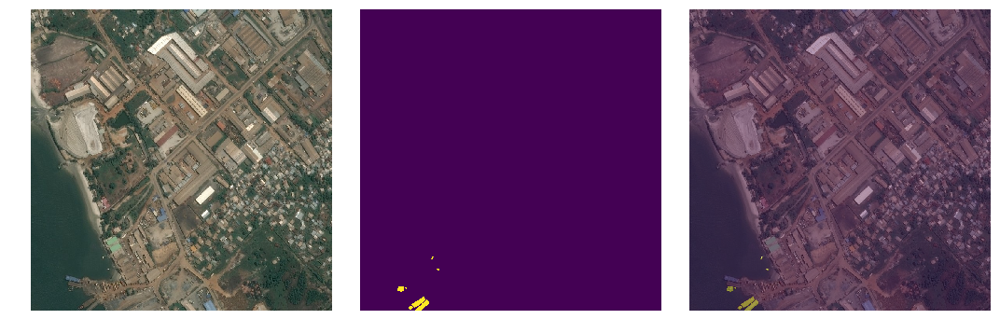

In [5]:
ImageId = '00021ddc3.jpg'

img = cv2.imread('../train/' + ImageId)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_masks = masks.loc[masks['ImageId'] == ImageId, 'EncodedPixels'].tolist()

# Take the individual ship masks and create a single mask array for all ships
all_masks = np.zeros((768, 768))
for mask in img_masks:
    all_masks += rle_decode(mask)
    
all_masks = np.minimum(all_masks, 1)
fig, axarr = plt.subplots(1, 3, figsize=(15, 40))
axarr[0].axis('off')
axarr[1].axis('off')
axarr[2].axis('off')
axarr[0].imshow(img)
axarr[1].imshow(all_masks)
axarr[2].imshow(img)
axarr[2].imshow(all_masks, alpha=0.4)
plt.tight_layout(h_pad=0.1, w_pad=0.1)
plt.show()

In [6]:
train_image_dir = "../train/"
test_image_dir = "../test/"
# これは1つ1つのデータを渡していくもの
class ShipDataset(Dataset):
    def __init__(self, in_df, transform=None, mode='train'):
        grp = list(in_df.groupby('ImageId'))
        self.image_ids =  [_id for _id, _ in grp] 
        self.image_masks = [m['EncodedPixels'].values for _,m in grp]
        self.transform = transform
        self.mode = mode
        self.img_transform = transforms.Compose([
        transforms.ToTensor(),
        # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.image_ids)
               
    def __getitem__(self, idx):
        img_file_name = self.image_ids[idx]
        if self.mode == 'train':
            rgb_path = os.path.join(train_image_dir, img_file_name)
        else:
            rgb_path = os.path.join(test_image_dir, img_file_name)
        img = cv2.imread(rgb_path)
        mask = masks_as_image(self.image_masks[idx])
       
        if self.transform is not None:
            img, mask = self.transform(img, mask)
        tmp = self.img_transform(img) 
        #type(tmp) = <class 'torch.FloatTensor'>
        # tmp.shape = torch.Size([3, 256, 256])
        #tmp -= tmp.mean(dim=1, keepdim=True).mean(dim=2,keepdim=True)
        #tmp /= tmp.view(3,-1).std(dim=1,keepdim=True).view(3,1,1) + 4e-1
    
        if self.mode == 'train':
            #return self.to_float_tensor(img), self.to_float_tensor(mask)
            #eturn img, mask
            return tmp, torch.from_numpy(np.moveaxis(mask, -1, 0)).float()
        else:
            return tmp, str(img_file_name)
    
class AirbusDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.image_paths = os.listdir(root_dir)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.image_paths[idx])
        image = cv2.imread(image_path)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        masked_img = create_mask(image_path)
        if self.transform:
            image = self.transform(image)
            masked_img = self.transform(masked_img)
        return image, masked_img

In [7]:
"""
    Implementation from  https://github.com/ternaus/robot-surgery-segmentation
"""

def clip(img, dtype, maxval):
    return np.clip(img, 0, maxval).astype(dtype)

class DualCompose:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, x, mask=None):
        for t in self.transforms:
            x, mask = t(x, mask)
        return x, mask
    
class OneOf:
    def __init__(self, transforms, prob=0.5):
        self.transforms = transforms
        self.prob = prob

    def __call__(self, x, mask=None):
        if random.random() < self.prob:
            t = random.choice(self.transforms)
            t.prob = 1.
            x, mask = t(x, mask)
        return x, mask

class OneOrOther:
    def __init__(self, first, second, prob=0.5):
        self.first = first
        first.prob = 1.
        self.second = second
        second.prob = 1.
        self.prob = prob

    def __call__(self, x, mask=None):
        if random.random() < self.prob:
            x, mask = self.first(x, mask)
        else:
            x, mask = self.second(x, mask)
        return x, mask


class ImageOnly:
    def __init__(self, trans):
        self.trans = trans

    def __call__(self, x, mask=None):
        return self.trans(x), mask


class VerticalFlip:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            img = cv2.flip(img, 0)
            if mask is not None:
                mask = cv2.flip(mask, 0)
        return img, mask


class HorizontalFlip:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            img = cv2.flip(img, 1)
            if mask is not None:
                mask = cv2.flip(mask, 1)
        return img, mask


class RandomFlip:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            d = random.randint(-1, 1)
            img = cv2.flip(img, d)
            if mask is not None:
                mask = cv2.flip(mask, d)
        return img, mask


class Transpose:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            img = img.transpose(1, 0, 2)
            if mask is not None:
                mask = mask.transpose(1, 0, 2)
        return img, mask


class RandomRotate90:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            factor = random.randint(0, 4)
            img = np.rot90(img, factor)
            if mask is not None:
                mask = np.rot90(mask, factor)
        return img.copy(), mask.copy()


class Rotate:
    def __init__(self, limit=90, prob=0.5):
        self.prob = prob
        self.limit = limit

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            angle = random.uniform(-self.limit, self.limit)

            height, width = img.shape[0:2]
            mat = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
            img = cv2.warpAffine(img, mat, (height, width),
                                 flags=cv2.INTER_LINEAR,
                                 borderMode=cv2.BORDER_REFLECT_101)
            if mask is not None:
                mask = cv2.warpAffine(mask, mat, (height, width),
                                      flags=cv2.INTER_LINEAR,
                                      borderMode=cv2.BORDER_REFLECT_101)

        return img, mask


class RandomCrop:
    def __init__(self, size):
        self.h = size[0]
        self.w = size[1]

    def __call__(self, img, mask=None):
        height, width, _ = img.shape

        h_start = np.random.randint(0, height - self.h)
        w_start = np.random.randint(0, width - self.w)

        img = img[h_start: h_start + self.h, w_start: w_start + self.w,:]

        assert img.shape[0] == self.h
        assert img.shape[1] == self.w

        if mask is not None:
            if mask.ndim == 2:
                mask = np.expand_dims(mask, axis=2)
            mask = mask[h_start: h_start + self.h, w_start: w_start + self.w,:]

        return img, mask


class Shift:
    def __init__(self, limit=4, prob=.5):
        self.limit = limit
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            limit = self.limit
            dx = round(random.uniform(-limit, limit))
            dy = round(random.uniform(-limit, limit))

            height, width, channel = img.shape
            y1 = limit + 1 + dy
            y2 = y1 + height
            x1 = limit + 1 + dx
            x2 = x1 + width

            img1 = cv2.copyMakeBorder(img, limit + 1, limit + 1, limit + 1, limit + 1,
                                      borderType=cv2.BORDER_REFLECT_101)
            img = img1[y1:y2, x1:x2, :]
            if mask is not None:
                msk1 = cv2.copyMakeBorder(mask, limit + 1, limit + 1, limit + 1, limit + 1,
                                          borderType=cv2.BORDER_REFLECT_101)
                mask = msk1[y1:y2, x1:x2, :]

        return img, mask


class ShiftScale:
    def __init__(self, limit=4, prob=.25):
        self.limit = limit
        self.prob = prob

    def __call__(self, img, mask=None):
        limit = self.limit
        if random.random() < self.prob:
            height, width, channel = img.shape
            assert (width == height)
            size0 = width
            size1 = width + 2 * limit
            size = round(random.uniform(size0, size1))

            dx = round(random.uniform(0, size1 - size))
            dy = round(random.uniform(0, size1 - size))

            y1 = dy
            y2 = y1 + size
            x1 = dx
            x2 = x1 + size

            img1 = cv2.copyMakeBorder(img, limit, limit, limit, limit, borderType=cv2.BORDER_REFLECT_101)
            img = (img1[y1:y2, x1:x2, :] if size == size0
            else cv2.resize(img1[y1:y2, x1:x2, :], (size0, size0), interpolation=cv2.INTER_LINEAR))

            if mask is not None:
                msk1 = cv2.copyMakeBorder(mask, limit, limit, limit, limit, borderType=cv2.BORDER_REFLECT_101)
                mask = (msk1[y1:y2, x1:x2, :] if size == size0
                else cv2.resize(msk1[y1:y2, x1:x2, :], (size0, size0), interpolation=cv2.INTER_LINEAR))

        return img, mask


class ShiftScaleRotate:
    def __init__(self, shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, prob=0.5):
        self.shift_limit = shift_limit
        self.scale_limit = scale_limit
        self.rotate_limit = rotate_limit
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            height, width, channel = img.shape

            angle = random.uniform(-self.rotate_limit, self.rotate_limit)
            scale = random.uniform(1 - self.scale_limit, 1 + self.scale_limit)
            dx = round(random.uniform(-self.shift_limit, self.shift_limit)) * width
            dy = round(random.uniform(-self.shift_limit, self.shift_limit)) * height

            cc = math.cos(angle / 180 * math.pi) * scale
            ss = math.sin(angle / 180 * math.pi) * scale
            rotate_matrix = np.array([[cc, -ss], [ss, cc]])

            box0 = np.array([[0, 0], [width, 0], [width, height], [0, height], ])
            box1 = box0 - np.array([width / 2, height / 2])
            box1 = np.dot(box1, rotate_matrix.T) + np.array([width / 2 + dx, height / 2 + dy])

            box0 = box0.astype(np.float32)
            box1 = box1.astype(np.float32)
            mat = cv2.getPerspectiveTransform(box0, box1)
            img = cv2.warpPerspective(img, mat, (width, height),
                                      flags=cv2.INTER_LINEAR,
                                      borderMode=cv2.BORDER_REFLECT_101)
            if mask is not None:
                mask = cv2.warpPerspective(mask, mat, (width, height),
                                           flags=cv2.INTER_NEAREST,
                                           borderMode=cv2.BORDER_REFLECT_101)

        return img, mask


class CenterCrop:
    def __init__(self, size):
        self.height = size[0]
        self.width = size[1]

    def __call__(self, img, mask=None):
        h, w, c = img.shape
        dy = (h - self.height) // 2
        dx = (w - self.width) // 2
        y1 = dy
        y2 = y1 + self.height
        x1 = dx
        x2 = x1 + self.width
        img = img[y1:y2, x1:x2,:]
        if mask is not None:
            if mask.ndim == 2:
                mask = np.expand_dims(mask, axis=2)
            mask = mask[y1:y2, x1:x2,:]

        return img, mask
    
class RandomBrightness:
    def __init__(self, limit=0.1, prob=0.5):
        self.limit = limit
        self.prob = prob

    def __call__(self, img):
        if random.random() < self.prob:
            alpha = 1.0 + self.limit * random.uniform(-1, 1)

            maxval = np.max(img[..., :3])
            dtype = img.dtype
            img[..., :3] = clip(alpha * img[..., :3], dtype, maxval)
        return img


class RandomContrast:
    def __init__(self, limit=.1, prob=.5):
        self.limit = limit
        self.prob = prob

    def __call__(self, img):
        if random.random() < self.prob:
            alpha = 1.0 + self.limit * random.uniform(-1, 1)

            gray = cv2.cvtColor(img[:, :, :3], cv2.COLOR_BGR2GRAY)
            gray = (3.0 * (1.0 - alpha) / gray.size) * np.sum(gray)
            maxval = np.max(img[..., :3])
            dtype = img.dtype
            img[:, :, :3] = clip(alpha * img[:, :, :3] + gray, dtype, maxval)
        return img

In [8]:
BATCH_SIZE = 20
img_size = 256

In [9]:
train_transform = DualCompose([
        HorizontalFlip(),
        VerticalFlip(),
        RandomCrop((256,256,3)),
        ImageOnly(RandomBrightness()),
        #ImageOnly(RandomContrast()),
])

"""
val_transform = DualCompose([
        CenterCrop((512,512,3)),
     ])
"""


"""
train_batch = data.DataLoader(train_dataset, batch_size=BATCH_SIZE,
                            shuffle=True, num_workers=2)
"""

'\ntrain_batch = data.DataLoader(train_dataset, batch_size=BATCH_SIZE,\n                            shuffle=True, num_workers=2)\n'

In [10]:
def make_loader(in_df, batch_size, shuffle=False, transform=None):
    return data.DataLoader(
        dataset=ShipDataset(in_df, transform=transform),
        shuffle=shuffle,
        num_workers=0,
        batch_size=batch_size,
        pin_memory=torch.cuda.is_available()) 

In [11]:
msk = np.random.rand(len(masks)) < 0.95
train_df = masks[msk]
valid_df = masks[~msk]

In [12]:
train_batch = make_loader(train_df, batch_size=BATCH_SIZE,shuffle=True,\
                           transform=train_transform)
valid_batch = make_loader(valid_df, batch_size=BATCH_SIZE//2,shuffle=False,\
                         transform=train_transform)
#pre_batch = make_loader(train_df, batch_size=BATCH_SIZE//4,shuffle=True,\
#                       transform=train_transform)

In [13]:
def conv_block(in_dim,out_dim,act_fn):
    model = nn.Sequential(
        nn.Conv2d(in_dim,out_dim, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_dim),
        act_fn,
    )
    return model


def conv_trans_block(in_dim,out_dim,act_fn):
    model = nn.Sequential(
        nn.ConvTranspose2d(in_dim,out_dim, kernel_size=3, stride=2, padding=1,output_padding=1),
        nn.BatchNorm2d(out_dim),
        act_fn,
    )
    return model


def maxpool():
    pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
    return pool


def conv_block_2(in_dim,out_dim,act_fn):
    model = nn.Sequential(
        conv_block(in_dim,out_dim,act_fn),
        nn.Conv2d(out_dim,out_dim, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_dim),
    )
    return model    


def conv_block_3(in_dim,out_dim,act_fn):
    model = nn.Sequential(
        conv_block(in_dim,out_dim,act_fn),
        conv_block(out_dim,out_dim,act_fn),
        nn.Conv2d(out_dim,out_dim, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_dim),
    )
    return model

## UNetにDropout層を追加(bridgeの直前)

In [14]:
class UnetGenerator(nn.Module):

	def __init__(self,in_dim,out_dim,num_filter, drop=0.1):
		super(UnetGenerator,self).__init__()
		self.in_dim = in_dim
		self.out_dim = out_dim
		self.num_filter = num_filter
		act_fn = nn.LeakyReLU(0.2, inplace=True)

		print("\n------Initiating U-Net------\n")

		self.down_1 = conv_block_2(self.in_dim,self.num_filter,act_fn)
		self.pool_1 = maxpool()
		self.down_2 = conv_block_2(self.num_filter*1,self.num_filter*2,act_fn)
		self.pool_2 = maxpool()
		self.down_3 = conv_block_2(self.num_filter*2,self.num_filter*4,act_fn)
		self.pool_3 = maxpool()
		self.down_4 = conv_block_2(self.num_filter*4,self.num_filter*8,act_fn)
		self.pool_4 = maxpool()
		self.dropout1 = nn.Dropout(p=drop)

		self.bridge = conv_block_2(self.num_filter*8,self.num_filter*16,act_fn)
        
        

		self.trans_1 = conv_trans_block(self.num_filter*16,self.num_filter*8,act_fn)
		self.up_1 = conv_block_2(self.num_filter*16,self.num_filter*8,act_fn)
		self.trans_2 = conv_trans_block(self.num_filter*8,self.num_filter*4,act_fn)
		self.up_2 = conv_block_2(self.num_filter*8,self.num_filter*4,act_fn)
		self.trans_3 = conv_trans_block(self.num_filter*4,self.num_filter*2,act_fn)
		self.up_3 = conv_block_2(self.num_filter*4,self.num_filter*2,act_fn)
		self.trans_4 = conv_trans_block(self.num_filter*2,self.num_filter*1,act_fn)
		self.up_4 = conv_block_2(self.num_filter*2,self.num_filter*1,act_fn)

		self.out = nn.Sequential(
			nn.Conv2d(self.num_filter,self.out_dim,3,1,1),
			nn.Tanh(),
		)

	def forward(self,input):
		down_1 = self.down_1(input)
		pool_1 = self.pool_1(down_1)
		down_2 = self.down_2(pool_1)
		pool_2 = self.pool_2(down_2)
		down_3 = self.down_3(pool_2)
		pool_3 = self.pool_3(down_3)
		down_4 = self.down_4(pool_3)
		pool_4 = self.pool_4(down_4)

		bridge = self.bridge(pool_4)
        # ここにdropout層
		dropout = self.dropout1(bridge)

		trans_1 = self.trans_1(dropout)
		concat_1 = torch.cat([trans_1,down_4],dim=1)
		up_1 = self.up_1(concat_1)
		trans_2 = self.trans_2(up_1)
		concat_2 = torch.cat([trans_2,down_3],dim=1)
		up_2 = self.up_2(concat_2)
		trans_3 = self.trans_3(up_2)
		concat_3 = torch.cat([trans_3,down_2],dim=1)
		up_3 = self.up_3(concat_3)
		trans_4 = self.trans_4(up_3)
		concat_4 = torch.cat([trans_4,down_1],dim=1)
		up_4 = self.up_4(concat_4)

		out = self.out(up_4)

		return out

In [15]:
class OneHotLoss(nn.Module):
    def __init__(self):
        super(OneHotLoss, self).__init__()  
    
    def forward(self, input, target):
        num_batch = BATCH_SIZE
        adm_multi = input * target 
        loss = - adm_multi.sum() / BATCH_SIZE
        return loss

class StableBCELoss(nn.Module):
    def __init__(self):
        super(StableBCELoss, self).__init__()
        
    def forward(self, input, target):
        neg_abs = - input.abs() 
        loss = input.clamp(min=0) - input*target + (1 + neg_abs.exp()).log()
        return loss.mean() 
    
class BCEWithDiceLoss(nn.Module):
    def __init__(self):
        super(BCEWithDiceLoss, self).__init__()
        
    def forward(self, input, target):
        neg_abs = - input.abs() 
        bce = input.clamp(min=0) - input*target + (1 + neg_abs.exp()).log()
        
        dice = 2 * (input * target).sum() / (target.sum() + input.sum())
        print("dice loss is ", dice)
        return bce.sum() - dice.log()

In [16]:
# recon_loss_func = OneHotLoss()
# last_file_path = "./kamata_model/final_model.pkl"
# last_file_path = "./u_model_0.002/u_net_5_3200.pkl"
recon_loss_func =nn.BCELoss().cuda(0)
# generator = nn.DataParallel(UnetGenerator(3,3,64),device_ids=[0]).cuda()
generator = UnetGenerator(3,1,64).cuda(0)
# generator.load_state_dict(torch.load(last_file_path))
# generator = torch.load(last_file_path)
lr = 0.001
gen_optimizer = torch.optim.Adam(generator.parameters(),lr=lr)


------Initiating U-Net------



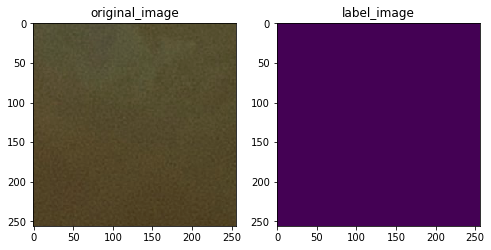

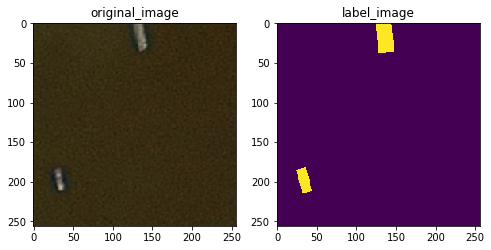

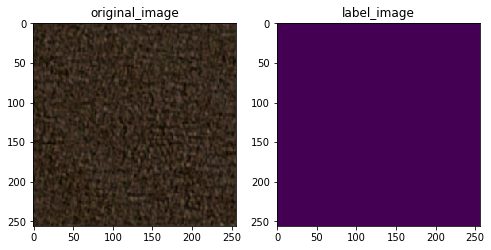

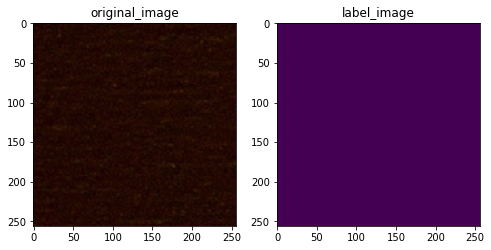

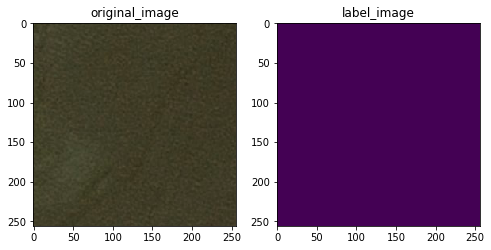

...

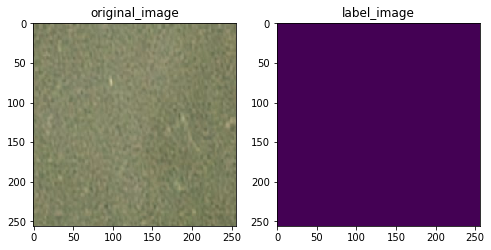

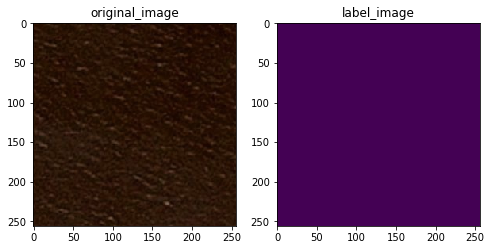

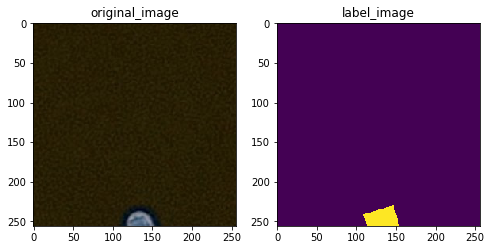

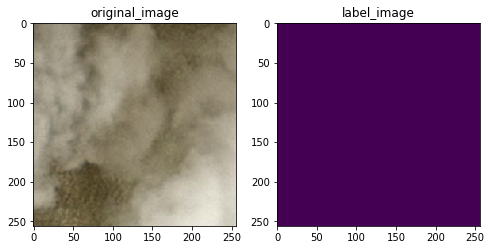

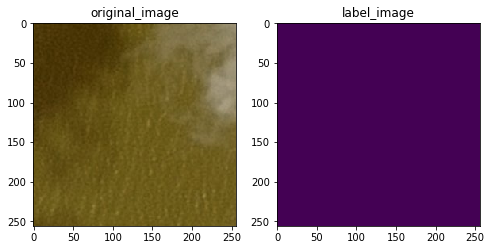

In [17]:
n = 0 
for _,(images,img_masks) in enumerate(train_batch):
    x = Variable(images).cuda(0)
    y_ = Variable(img_masks.mean(dim=1,keepdim=True)).cuda(0).cpu()
    for k in range(16):
        plt.figure(figsize=(8,15))
        plt.subplot(121)
        plt.imshow(np.array(x.cpu().data[k] *256,dtype=np.uint8).transpose()) 
        plt.title("original_image")
        plt.subplot(122)
        plt.imshow(np.array(y_.cpu().data[k]).mean(axis=0).transpose()) 
        plt.title("label_image") 
        plt.show()
        
    n += 1 
    if n >= 2:
        break
        

In [18]:
import matplotlib.colors as clr
from mpl_toolkits.axes_grid1 import make_axes_locatable
cdict3 = {'red':((0.0,1.0,1.0),
                 (0.5,0.25,0.25),
                 (1.0,1.0,1.0)),
          'green':((0.0,1.0,1.0),
                   (0.5,0.5,0.5),
                   (0.75,1.0,1.0),
                   (1.0,0.25,0.25)),
          'blue':((0.0,1.0,1.0),
                  (0.5,0.75,0.75),
                  (0.75,0.0,0.0),
                  (1.0,0.0,0.0))}
cmap = clr.LinearSegmentedColormap('cmap', cdict3)


## 事前学習

In [19]:
"""
for _, (images, img_masks) in enumerate(pre_batch):
    gen_optimizer.zero_grad() 
    
    x = Variable(images).cuda(0)
    y = generator.forward(x).cuda(0)
    img_arr = x.data.cpu().numpy() 
    img_arr = img_arr.transpose(0, 2, 3, 1)
    img_gray = np.zeros((img_arr.shape[0], img_size, img_size))
    for k in range(img_arr.shape[0]):
        temp = cv2.cvtColor(img_arr[k], cv2.COLOR_BGR2GRAY)
        img_gray[k] = temp.copy() 
        del temp
        gc.collect() 
    img_gray += img_gray.min(axis=(1,2), keepdims=True)
    img_gray /= img_gray.max(axis=(1,2), keepdims=True) - img_gray.min(axis=(1,2), keepdims=True)
    img_gray = img_gray.reshape(-1, 1, img_size, img_size)
    img_gray /= 3.0
    img_tensor = torch.from_numpy(img_gray)
    y_ = Variable(img_tensor.float()).cuda(0)
    
    loss = recon_loss_func(y, y_) 
    loss.backward() 
    gen_optimizer.step() 
    if _ % 100 == 0:
        print(_ , "\ttime   loss:\t", loss.data[0])
        torch.save(generator.state_dict(),"pre_trained_model.pkl")
    if _ >= 40:
        torch.save(generator.state_dict(),"pre_trained_model.pkl")
        break
"""


'\nfor _, (images, img_masks) in enumerate(pre_batch):\n    gen_optimizer.zero_grad() \n    \n    x = Variable(images).cuda(0)\n    y = generator.forward(x).cuda(0)\n    img_arr = x.data.cpu().numpy() \n    img_arr = img_arr.transpose(0, 2, 3, 1)\n    img_gray = np.zeros((img_arr.shape[0], img_size, img_size))\n    for k in range(img_arr.shape[0]):\n        temp = cv2.cvtColor(img_arr[k], cv2.COLOR_BGR2GRAY)\n        img_gray[k] = temp.copy() \n        del temp\n        gc.collect() \n    img_gray += img_gray.min(axis=(1,2), keepdims=True)\n    img_gray /= img_gray.max(axis=(1,2), keepdims=True) - img_gray.min(axis=(1,2), keepdims=True)\n    img_gray = img_gray.reshape(-1, 1, img_size, img_size)\n    img_gray /= 3.0\n    img_tensor = torch.from_numpy(img_gray)\n    y_ = Variable(img_tensor.float()).cuda(0)\n    \n    loss = recon_loss_func(y, y_) \n    loss.backward() \n    gen_optimizer.step() \n    if _ % 100 == 0:\n        print(_ , "\ttime   loss:\t", loss.data[0])\n        torch.s

In [20]:
trained_path = "./u_model_0.002/u_net_6_0.pkl"
generator.load_state_dict(torch.load(trained_path))

c:\users\sunhe\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:14: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
  
c:\users\sunhe\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:15: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
  from ipykernel import kernelapp as app
c:\users\sunhe\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:21: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


epoch : 6, time : 0, loss : 0.007621892727911472


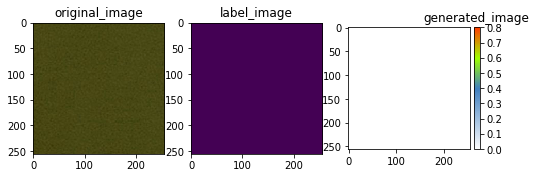

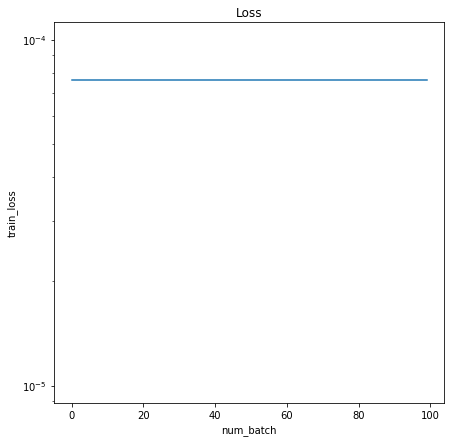

c:\users\sunhe\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:59: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Epoch :6, Time : 0 , Valid_Loss: 0.005452308338135481
epoch : 6, time : 400, loss : 0.000589179340749979


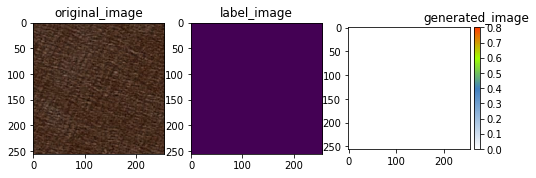

epoch : 6, time : 800, loss : 0.0017219551373273134


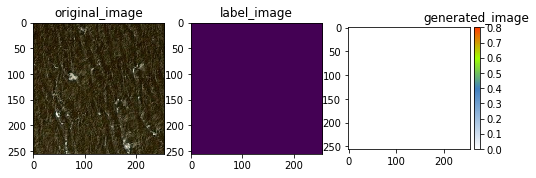

epoch : 6, time : 1200, loss : 0.00194047880358994


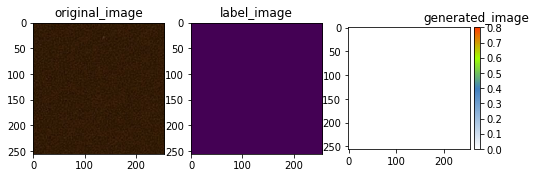

epoch : 6, time : 1600, loss : 0.0028162826783955097


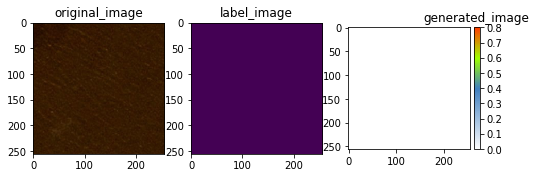

epoch : 6, time : 2000, loss : 0.002754715969786048


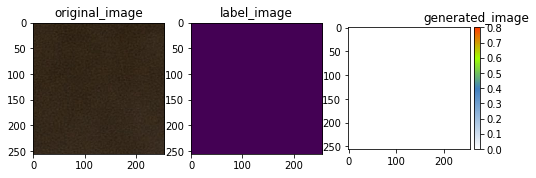

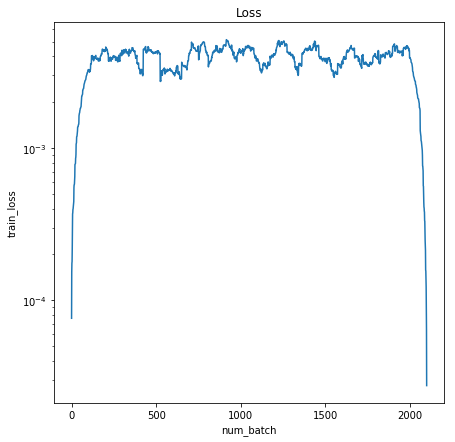

Epoch :6, Time : 2000 , Valid_Loss: 0.005367637611925602
epoch : 6, time : 2400, loss : 0.00021317266509868205


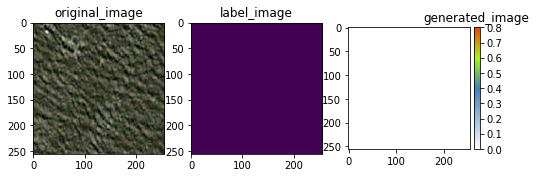

epoch : 6, time : 2800, loss : 0.002085159532725811


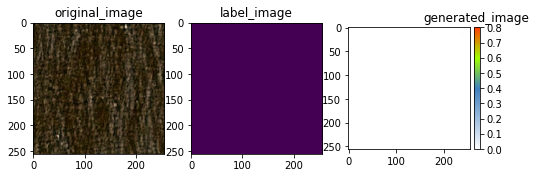

epoch : 6, time : 3200, loss : 0.0007772980025038123


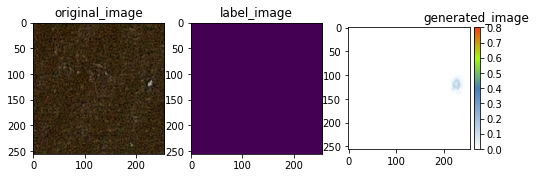

epoch : 6, time : 3600, loss : 0.001424020971171558


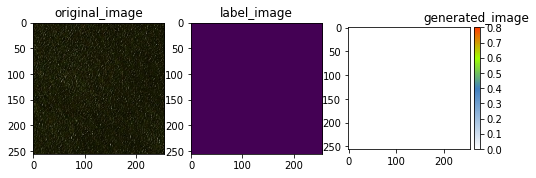

epoch : 6, time : 4000, loss : 0.003178586019203067


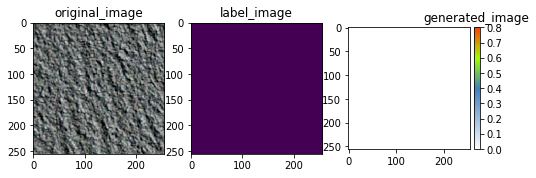

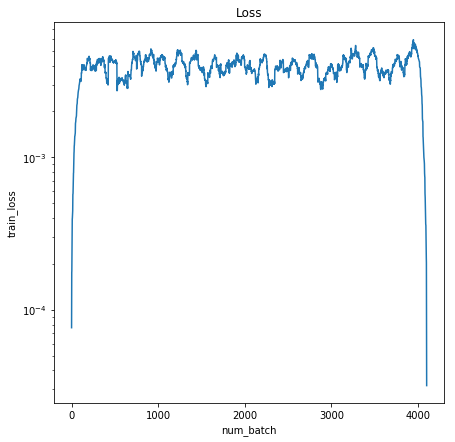

Epoch :6, Time : 4000 , Valid_Loss: 0.004867943469434977
epoch : 6, time : 4400, loss : 0.005155698396265507


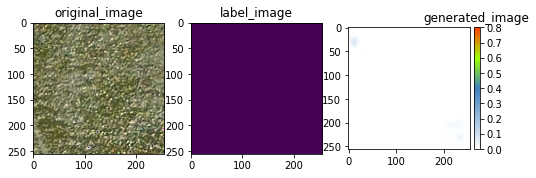

epoch : 6, time : 4800, loss : 0.04545127600431442


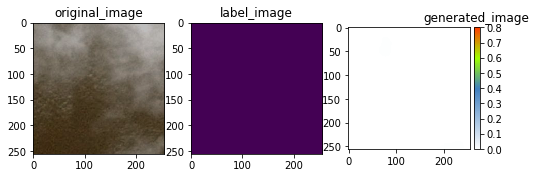

epoch : 7, time : 0, loss : 0.00179195124655962


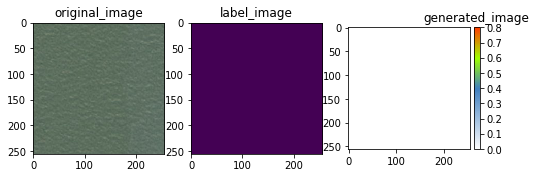

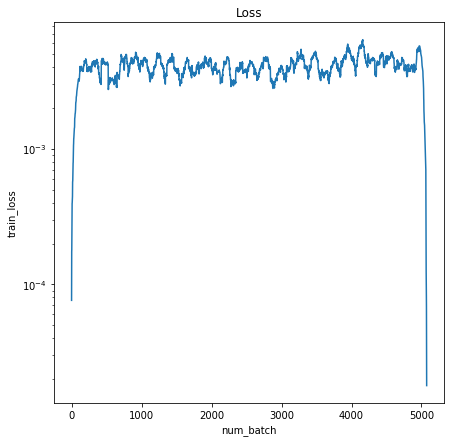

Epoch :7, Time : 0 , Valid_Loss: 0.005366262514144182
epoch : 7, time : 400, loss : 0.010337093845009804


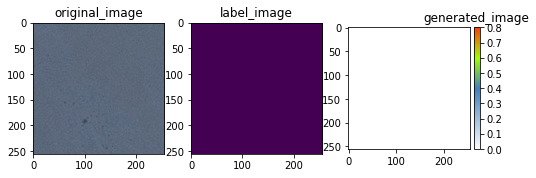

epoch : 7, time : 800, loss : 0.0013550089206546545


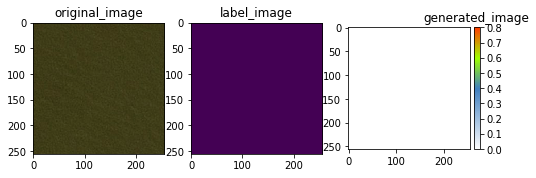

epoch : 7, time : 1200, loss : 0.006236332468688488


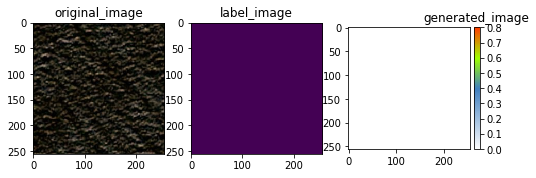

epoch : 7, time : 1600, loss : 0.004579536616802216


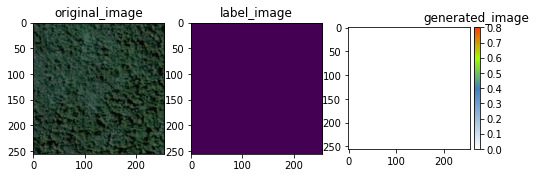

epoch : 7, time : 2000, loss : 0.0004356729914434254


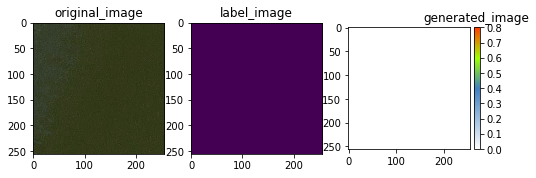

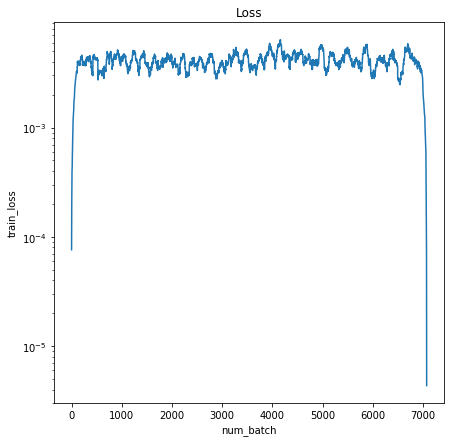

Epoch :7, Time : 2000 , Valid_Loss: 0.005656854715198278
epoch : 7, time : 2400, loss : 0.00616595521569252


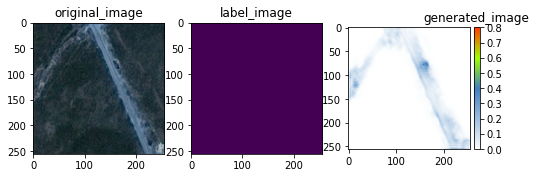

epoch : 7, time : 2800, loss : 0.003241733182221651


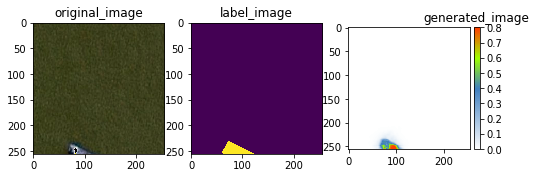

epoch : 7, time : 3200, loss : 0.001095219631679356


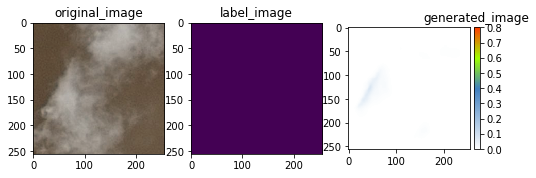

epoch : 7, time : 3600, loss : 0.009501157328486443


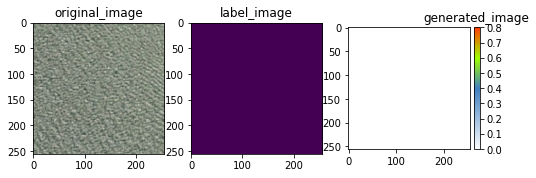

epoch : 7, time : 4000, loss : 0.0027520593721419573


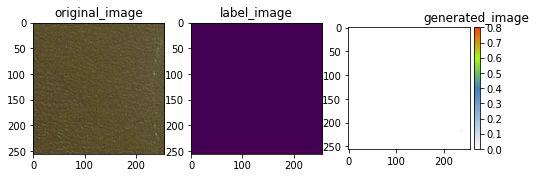

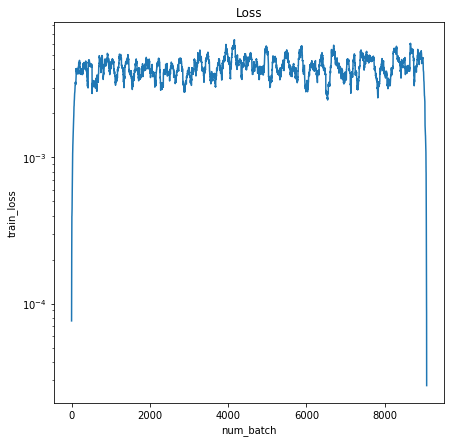

Epoch :7, Time : 4000 , Valid_Loss: 0.006054146680980921
epoch : 7, time : 4400, loss : 0.004434756003320217


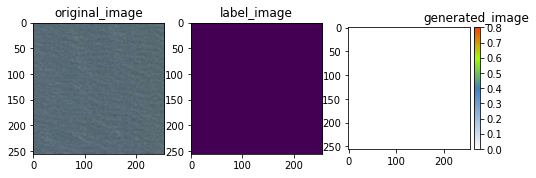

epoch : 7, time : 4800, loss : 0.0036021985579282045


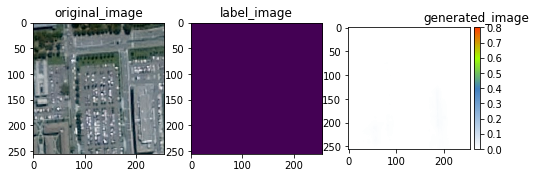

epoch : 8, time : 0, loss : 0.0018554923590272665


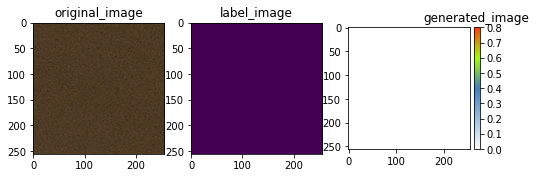

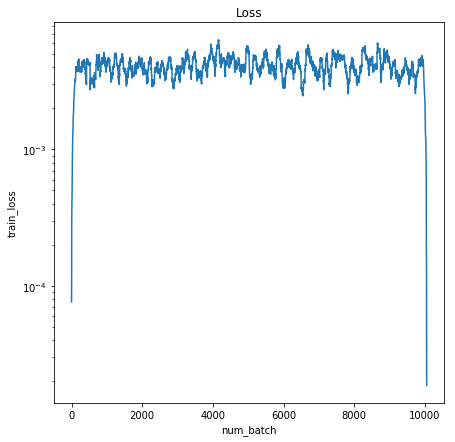

Epoch :8, Time : 0 , Valid_Loss: 0.006816641893237829
the learning rate turned to be   0.0001
epoch : 8, time : 400, loss : 0.002390226349234581


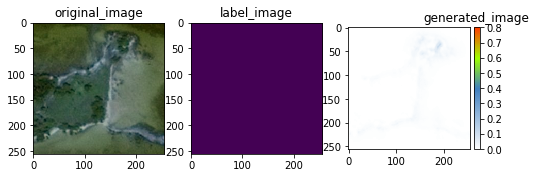

epoch : 8, time : 800, loss : 0.0027376716025173664


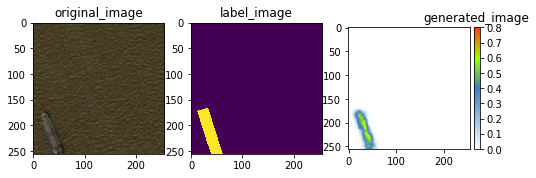

epoch : 8, time : 1200, loss : 0.0019295666133984923


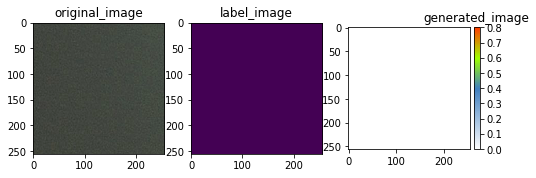

epoch : 8, time : 1600, loss : 0.0001786091597750783


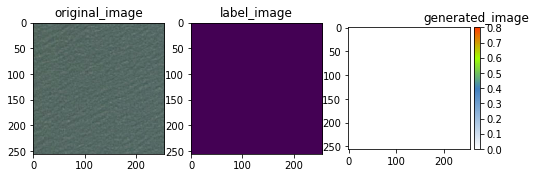

epoch : 8, time : 2000, loss : 0.0015326346037909389


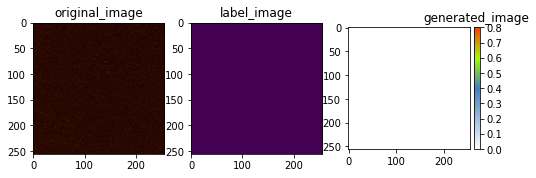

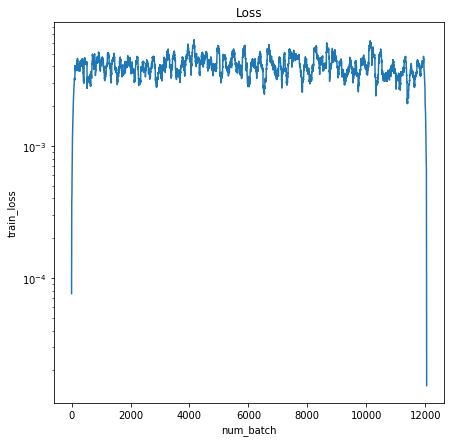

Epoch :8, Time : 2000 , Valid_Loss: 0.005864167585968971
epoch : 8, time : 2400, loss : 0.0019483190262690187


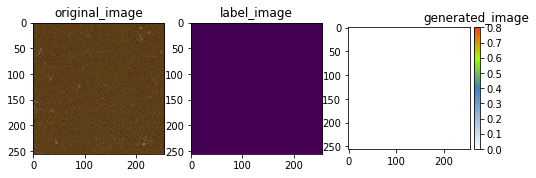

epoch : 8, time : 2800, loss : 0.001135057769715786


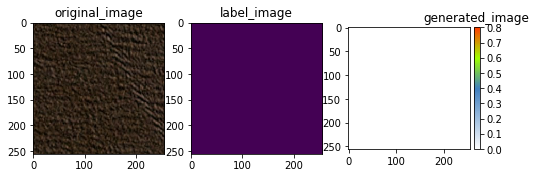

epoch : 8, time : 3200, loss : 0.0002754615561570972


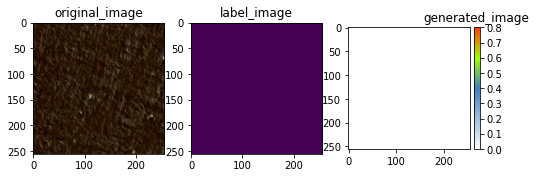

epoch : 8, time : 3600, loss : 0.0014133424265310168


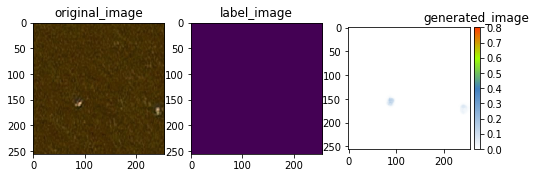

epoch : 8, time : 4000, loss : 0.0032707881182432175


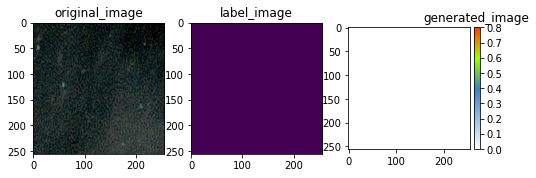

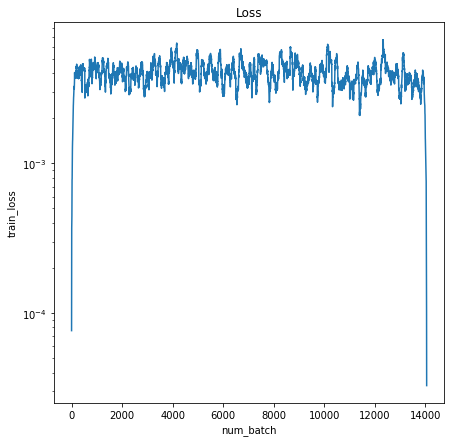

Epoch :8, Time : 4000 , Valid_Loss: 0.0059785437770187855
epoch : 8, time : 4400, loss : 0.0003064265474677086


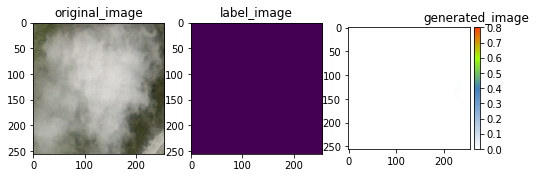

epoch : 8, time : 4800, loss : 0.0011559934355318546


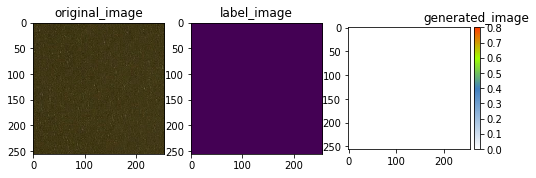

epoch : 9, time : 0, loss : 0.0012881291331723332


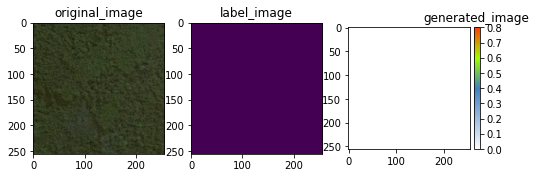

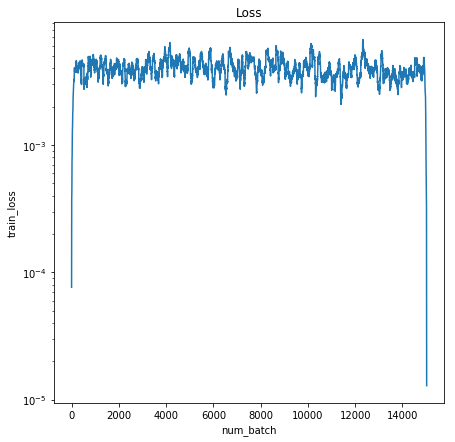

Epoch :9, Time : 0 , Valid_Loss: 0.006346662528812885
epoch : 9, time : 400, loss : 0.000687449355609715


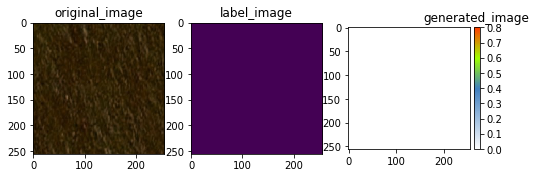

epoch : 9, time : 800, loss : 0.033185917884111404


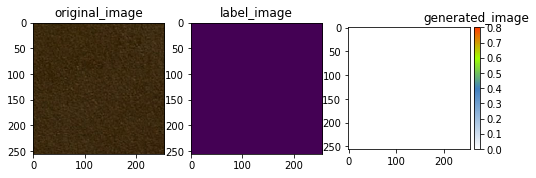

epoch : 9, time : 1200, loss : 0.025489088147878647


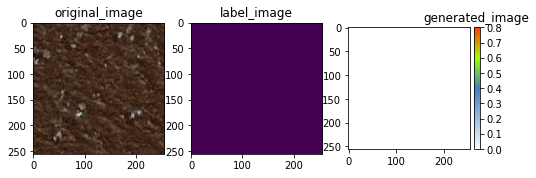

epoch : 9, time : 1600, loss : 0.0014331898419186473


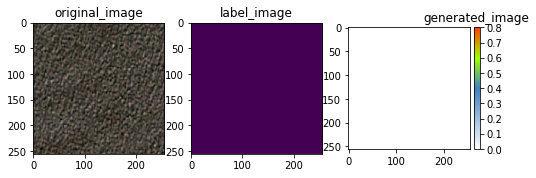

epoch : 9, time : 2000, loss : 0.002074189018458128


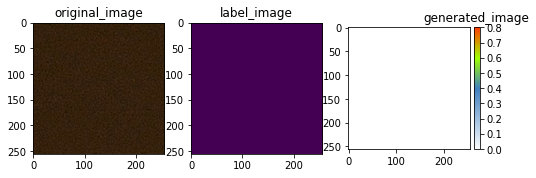

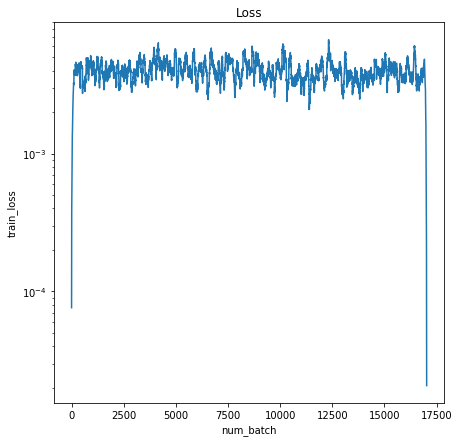

Epoch :9, Time : 2000 , Valid_Loss: 0.0049720690585672855
epoch : 9, time : 2400, loss : 0.0004701200523413718


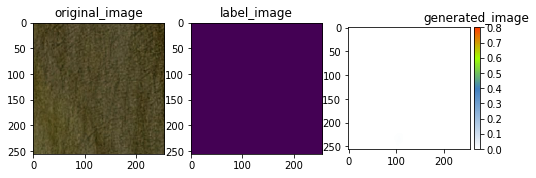

epoch : 9, time : 2800, loss : 0.009365368634462357


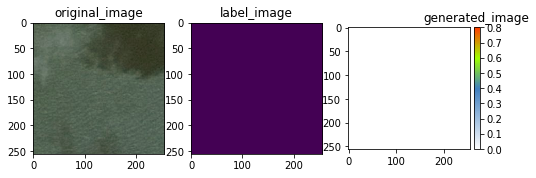

epoch : 9, time : 3200, loss : 0.0012382148997858167


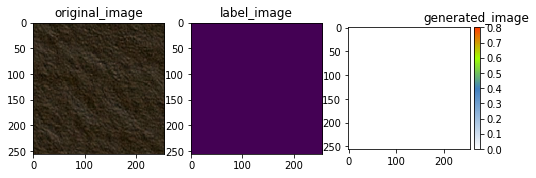

epoch : 9, time : 3600, loss : 0.0061352988705039024


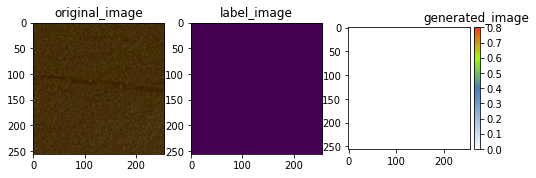

epoch : 9, time : 4000, loss : 0.0014659893931820989


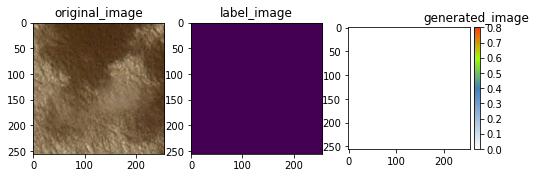

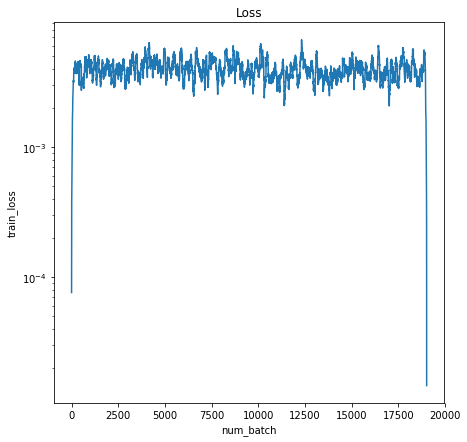

Epoch :9, Time : 4000 , Valid_Loss: 0.005787957925349474
epoch : 9, time : 4400, loss : 0.0017841181252151728


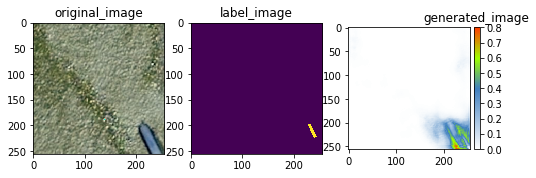

epoch : 9, time : 4800, loss : 0.01144607923924923


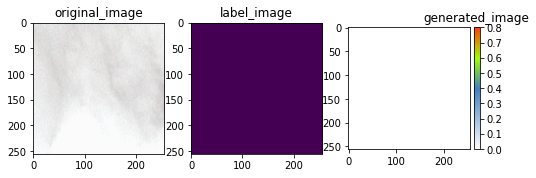

epoch : 10, time : 0, loss : 0.0011860036756843328


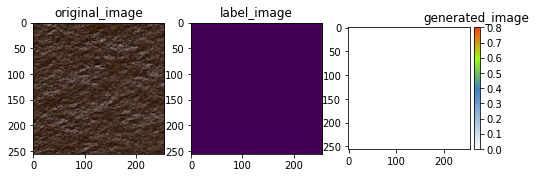

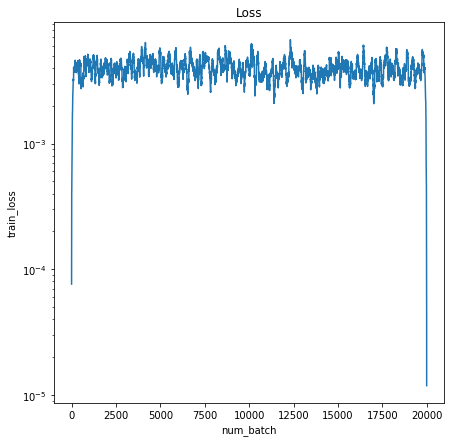

Epoch :10, Time : 0 , Valid_Loss: 0.005376044660806656
epoch : 10, time : 400, loss : 0.00396340386942029


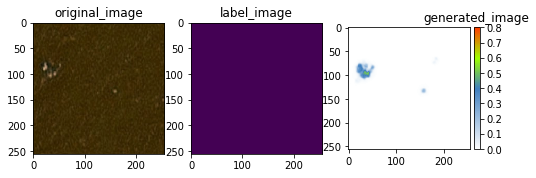

epoch : 10, time : 800, loss : 0.003152142046019435


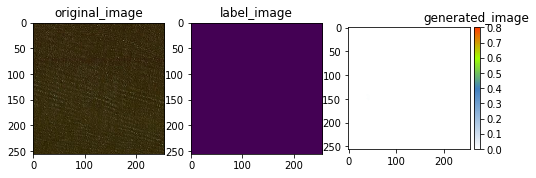

epoch : 10, time : 1200, loss : 0.0009762045228853822


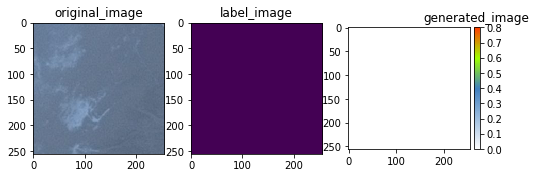

epoch : 10, time : 1600, loss : 0.00035334230051375926


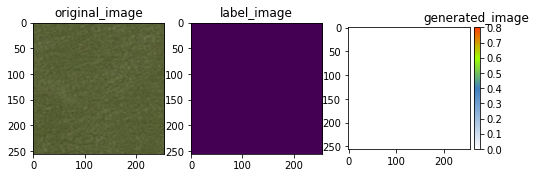

epoch : 10, time : 2000, loss : 0.00046355565427802503


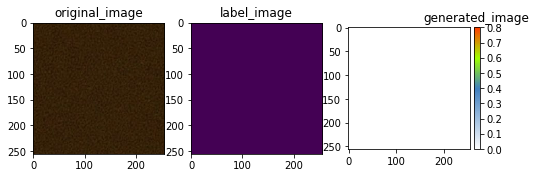

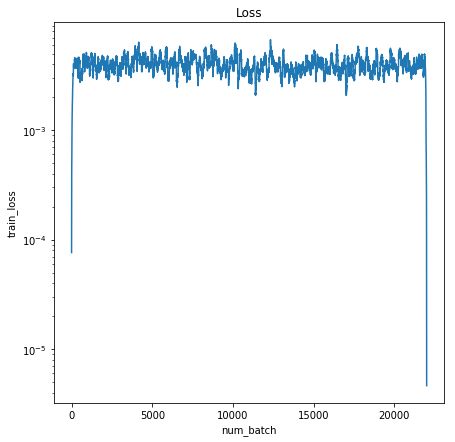

Epoch :10, Time : 2000 , Valid_Loss: 0.005570088047534227
epoch : 10, time : 2400, loss : 0.0022895783185958862


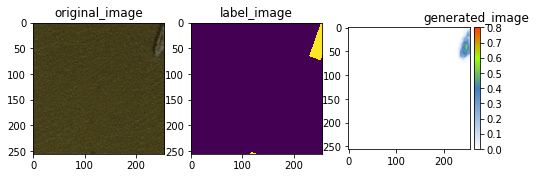

epoch : 10, time : 2800, loss : 0.007069825194776058


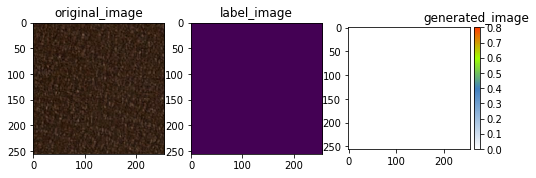

epoch : 10, time : 3200, loss : 0.0014188981149345636


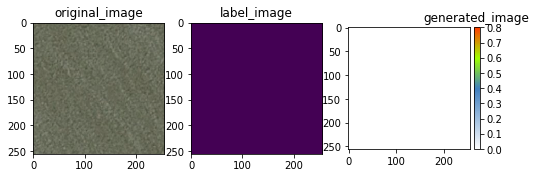

epoch : 10, time : 3600, loss : 0.0020981887355446815


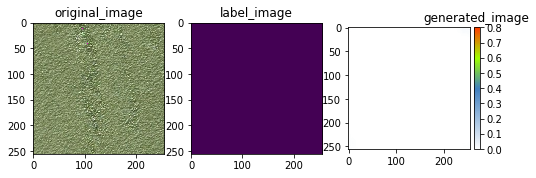

epoch : 10, time : 4000, loss : 0.0015280634397640824


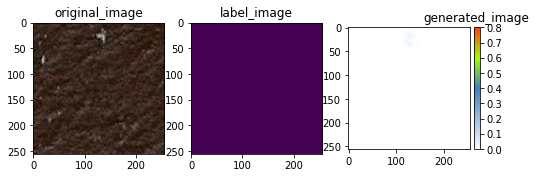

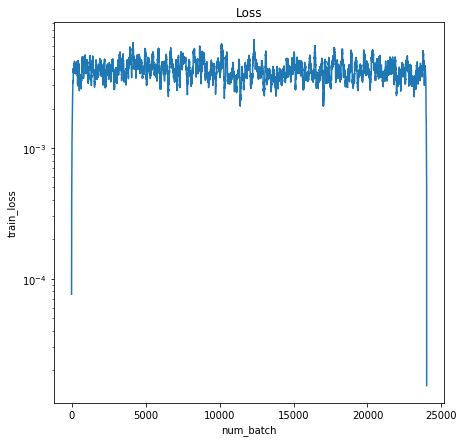

Epoch :10, Time : 4000 , Valid_Loss: 0.00608063442632556
epoch : 10, time : 4400, loss : 0.0031405966728925705


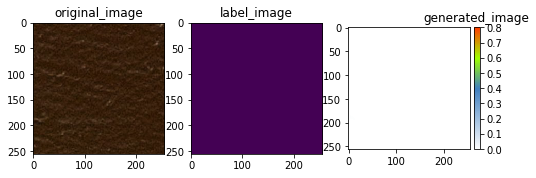

epoch : 10, time : 4800, loss : 0.0009696994093246758


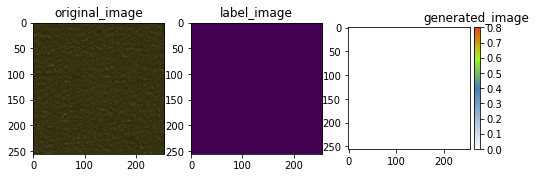

epoch : 11, time : 0, loss : 0.002696915529668331


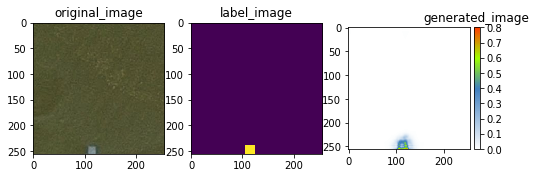

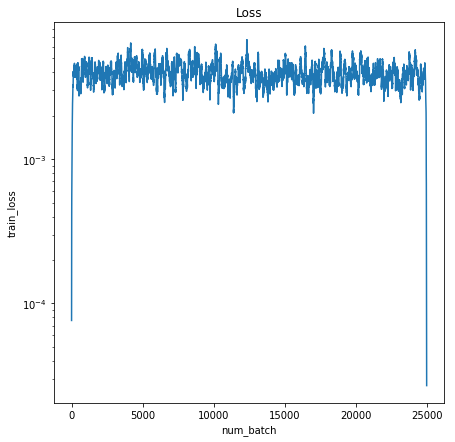

Epoch :11, Time : 0 , Valid_Loss: 0.005623490083962679
the learning rate turned to be   5e-05
epoch : 11, time : 400, loss : 0.00016000954201444983


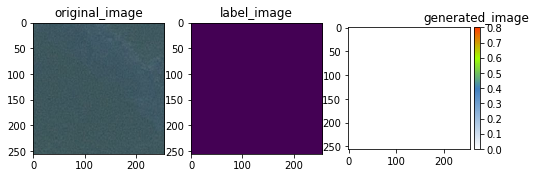

epoch : 11, time : 800, loss : 0.00013804873742628843


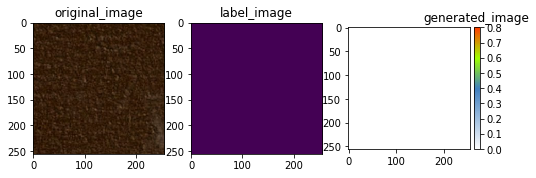

epoch : 11, time : 1200, loss : 0.029413362964987755


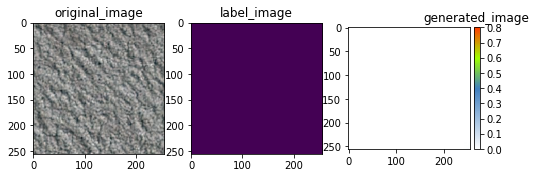

epoch : 11, time : 1600, loss : 0.002413978334516287


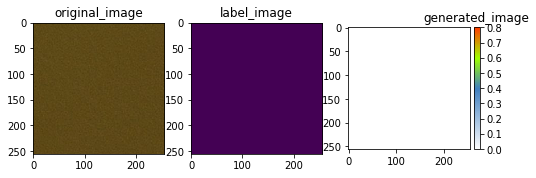

epoch : 11, time : 2000, loss : 0.0006104279309511185


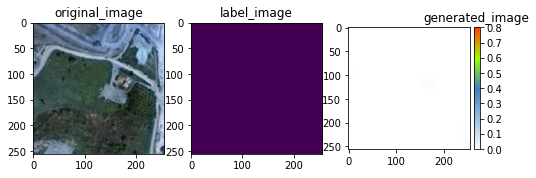

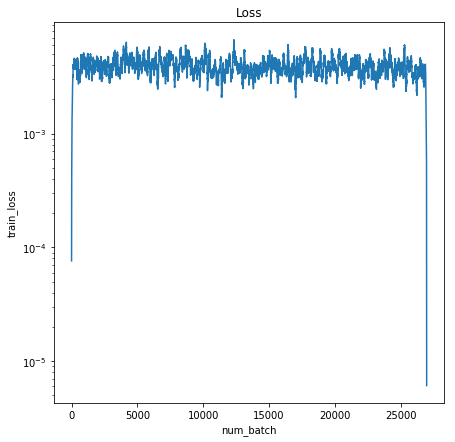

Epoch :11, Time : 2000 , Valid_Loss: 0.0055138347670435905
epoch : 11, time : 2400, loss : 0.0009954971028491855


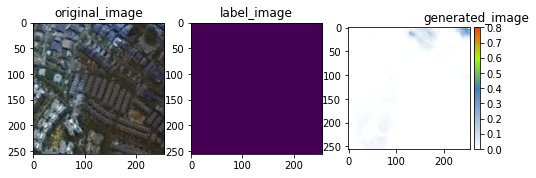

epoch : 11, time : 2800, loss : 0.0009304505656473339


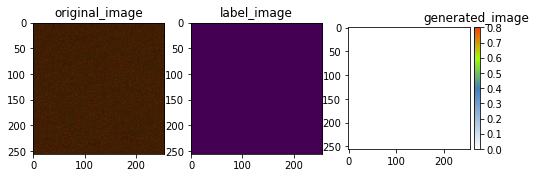

epoch : 11, time : 3200, loss : 0.002254423452541232


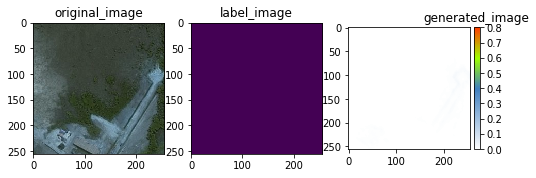

epoch : 11, time : 3600, loss : 0.005335885100066662


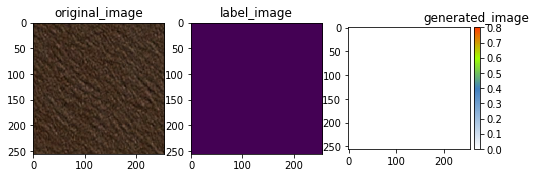

epoch : 11, time : 4000, loss : 0.0017956619849428535


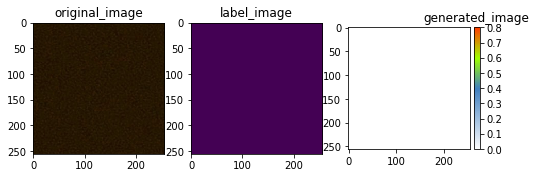

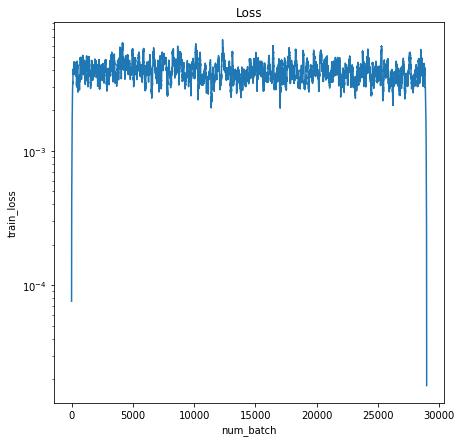

Epoch :11, Time : 4000 , Valid_Loss: 0.005530221853405237
epoch : 11, time : 4400, loss : 0.00043362349970266223


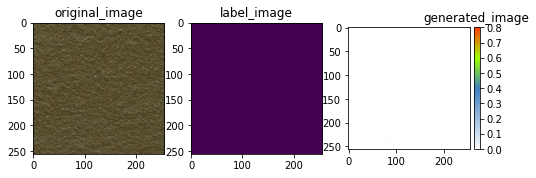

epoch : 11, time : 4800, loss : 0.005208113696426153


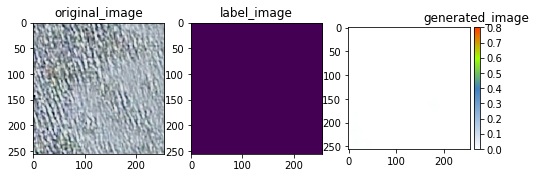

epoch : 12, time : 0, loss : 0.00012950555537827313


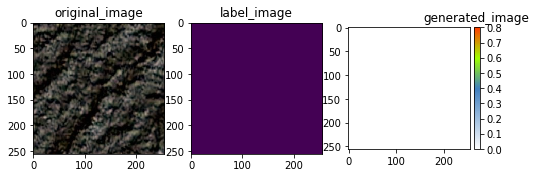

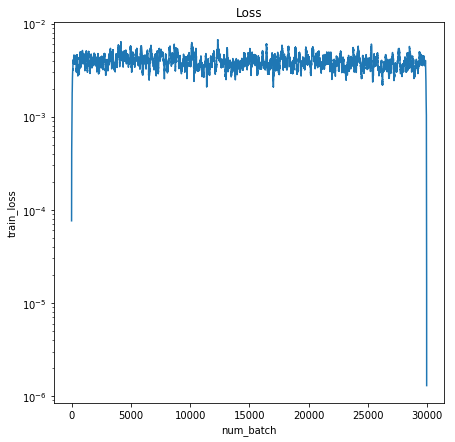

Epoch :12, Time : 0 , Valid_Loss: 0.0063304537907242775
the learning rate turned to be   2.5e-05
epoch : 12, time : 400, loss : 0.0003657886991277337


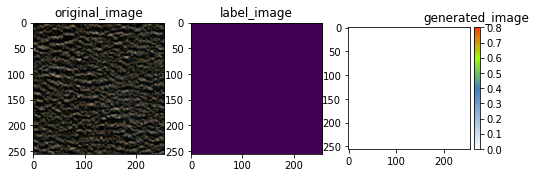

epoch : 12, time : 800, loss : 0.0010383634362369776


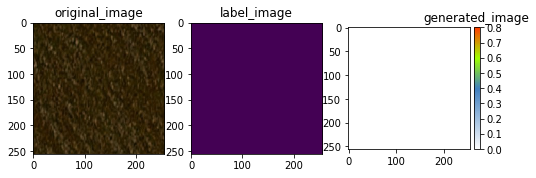

epoch : 12, time : 1200, loss : 0.0070001231506466866


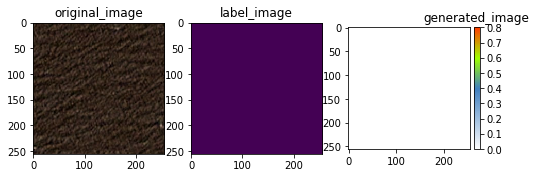

epoch : 12, time : 1600, loss : 0.00483229523524642


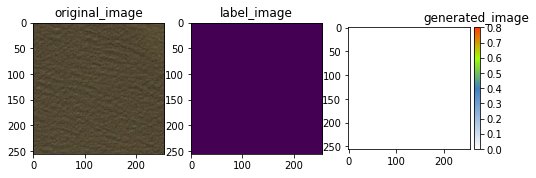

epoch : 12, time : 2000, loss : 0.0027157836593687534


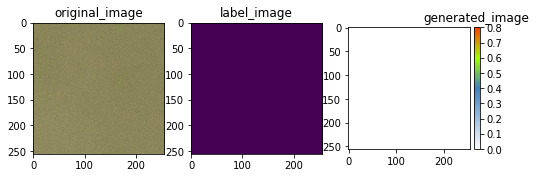

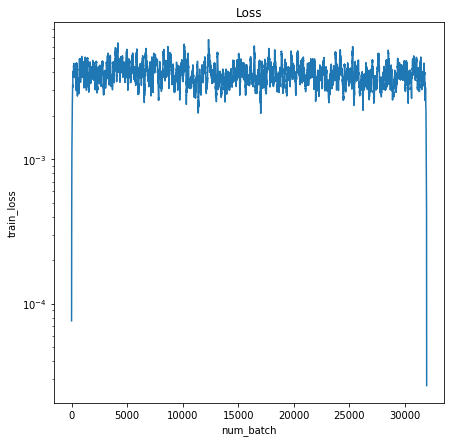

Epoch :12, Time : 2000 , Valid_Loss: 0.0051592569798231125
epoch : 12, time : 2400, loss : 0.01393975131213665


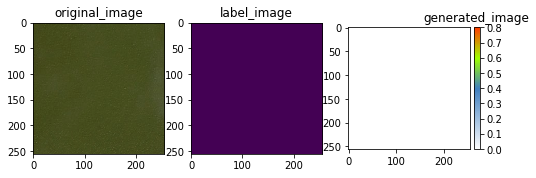

epoch : 12, time : 2800, loss : 0.0032338742166757584


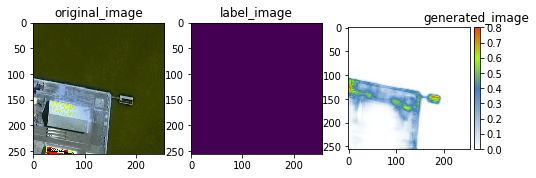

epoch : 12, time : 3200, loss : 0.0027974764816462994


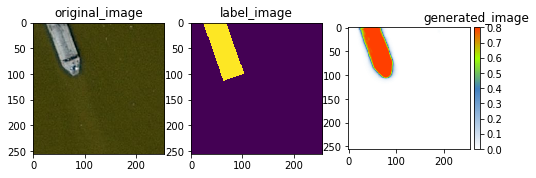

epoch : 12, time : 3600, loss : 0.0003314595960546285


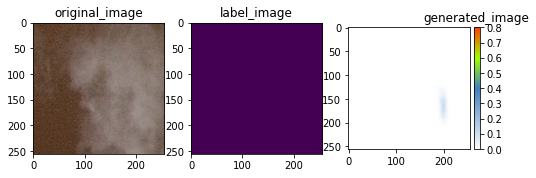

epoch : 12, time : 4000, loss : 0.0004955969052389264


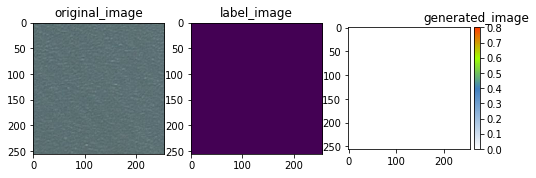

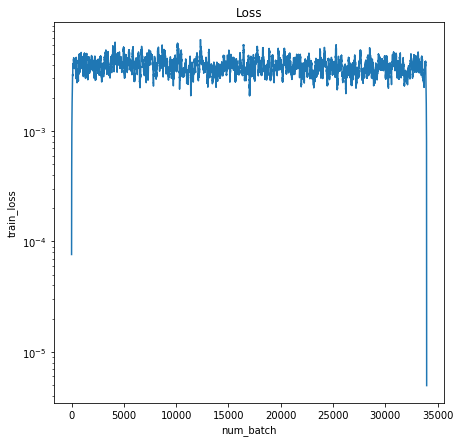

Epoch :12, Time : 4000 , Valid_Loss: 0.006007818039506674
epoch : 12, time : 4400, loss : 0.026864444836974144


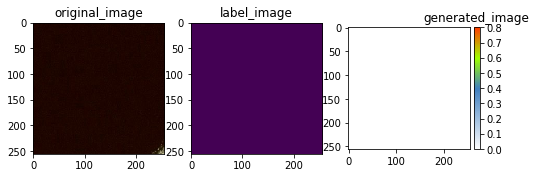

epoch : 12, time : 4800, loss : 0.00017612917872611433


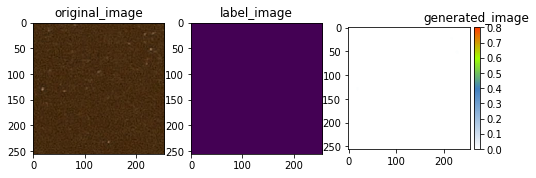

epoch : 13, time : 0, loss : 0.0010529361898079515


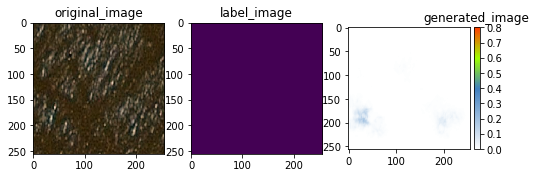

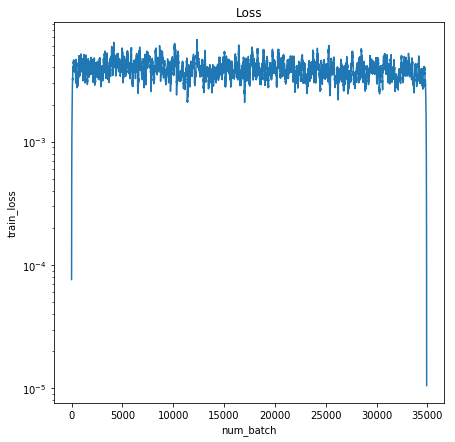

Epoch :13, Time : 0 , Valid_Loss: 0.005597022362053394
epoch : 13, time : 400, loss : 0.0026847454719245434


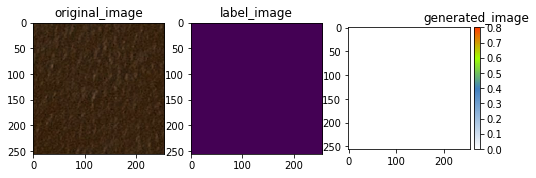

epoch : 13, time : 800, loss : 0.00028479384491220117


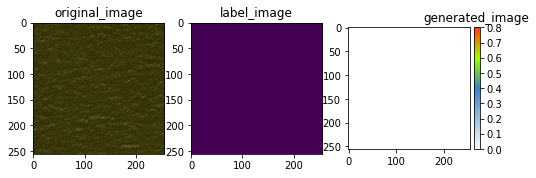

epoch : 13, time : 1200, loss : 0.0013482149224728346


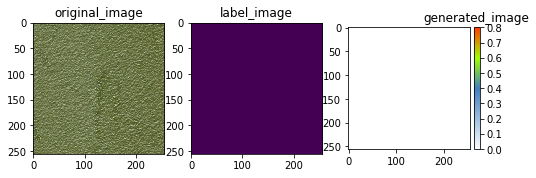

epoch : 13, time : 1600, loss : 0.003045712597668171


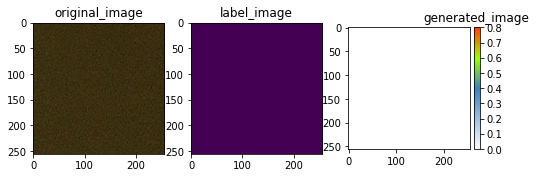

epoch : 13, time : 2000, loss : 0.0017266686772927642


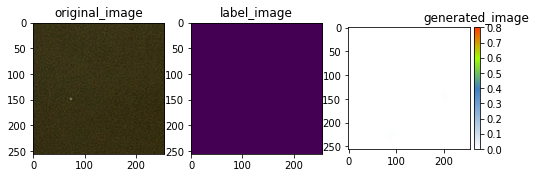

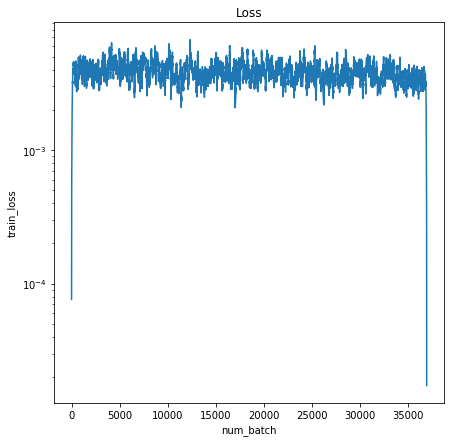

Epoch :13, Time : 2000 , Valid_Loss: 0.0060022445395588875
epoch : 13, time : 2400, loss : 0.0021119555458426476


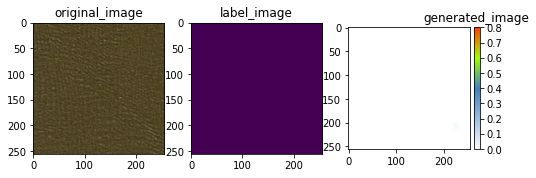

epoch : 13, time : 2800, loss : 0.0025816969573497772


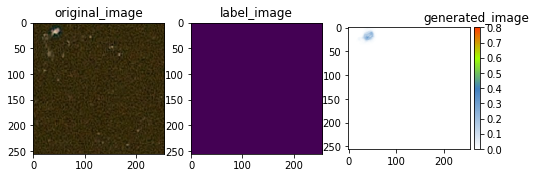

epoch : 13, time : 3200, loss : 0.00032745240605436265


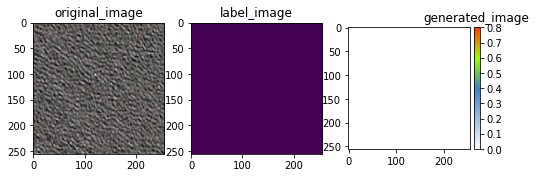

epoch : 13, time : 3600, loss : 0.0021320576779544353


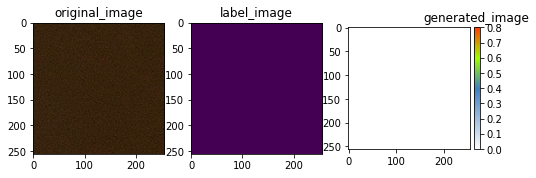

epoch : 13, time : 4000, loss : 0.000874096411280334


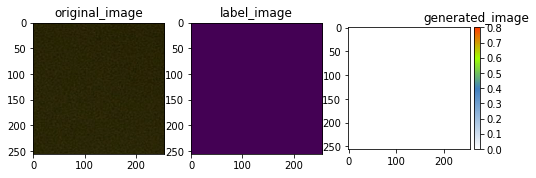

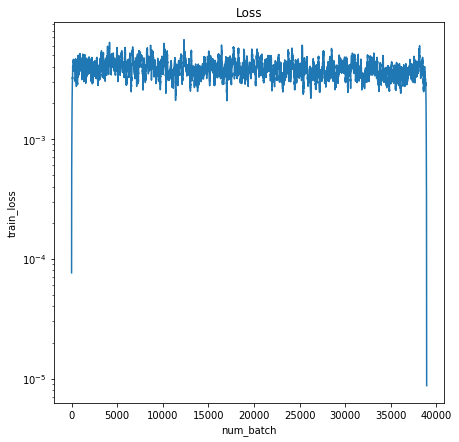

Epoch :13, Time : 4000 , Valid_Loss: 0.005335729569196701
epoch : 13, time : 4400, loss : 0.0024493227247148752


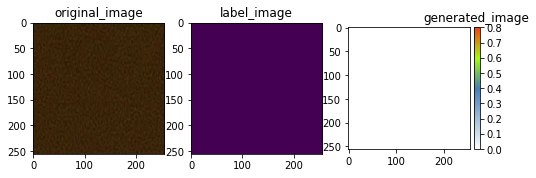

epoch : 13, time : 4800, loss : 0.0030053004156798124


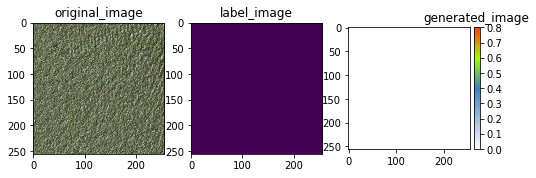

epoch : 14, time : 0, loss : 0.014715470373630524


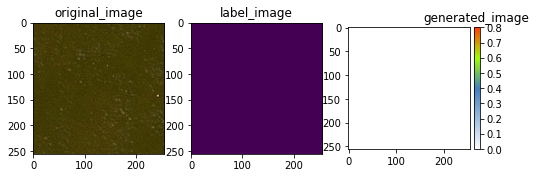

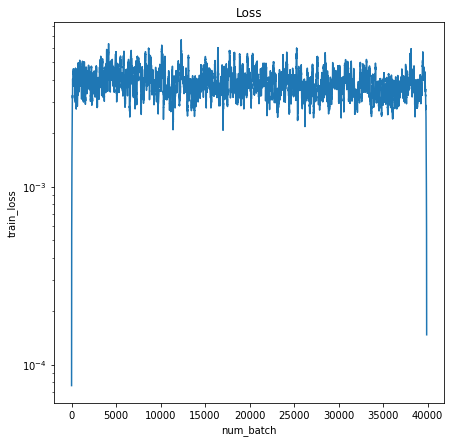

Epoch :14, Time : 0 , Valid_Loss: 0.005181469488888979
epoch : 14, time : 400, loss : 0.0009347344748675823


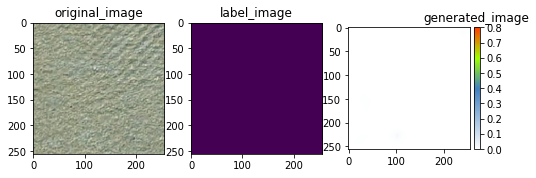

epoch : 14, time : 800, loss : 0.0008595298859290779


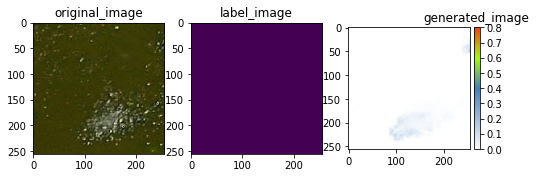

epoch : 14, time : 1200, loss : 0.0050487155094742775


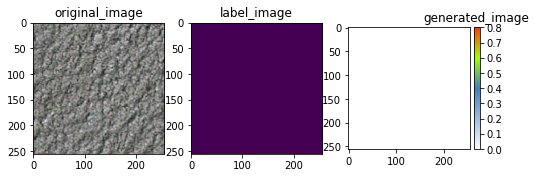

epoch : 14, time : 1600, loss : 0.0004319152212701738


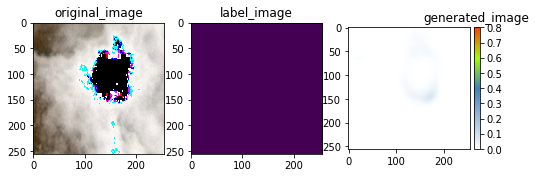

epoch : 14, time : 2000, loss : 0.0007974996115081012


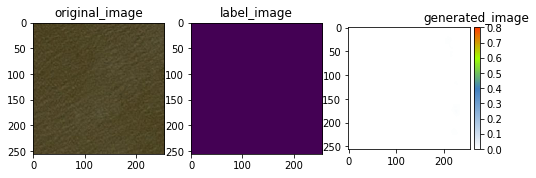

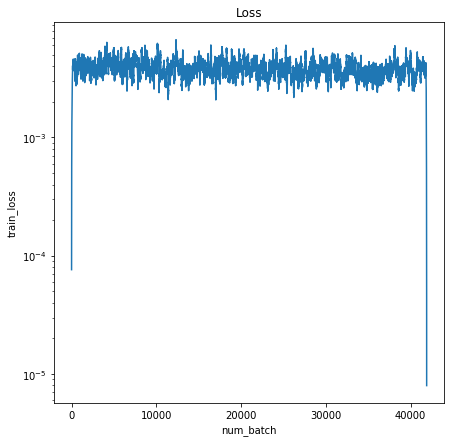

Epoch :14, Time : 2000 , Valid_Loss: 0.005174318328499794
epoch : 14, time : 2400, loss : 0.0018764551496133208


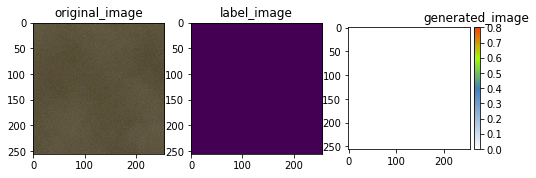

epoch : 14, time : 2800, loss : 0.001066209515556693


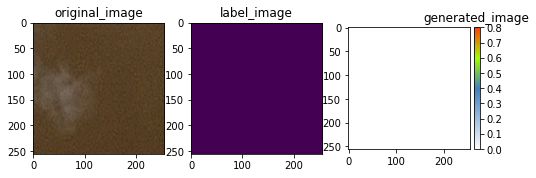

epoch : 14, time : 3200, loss : 0.0011739397887140512


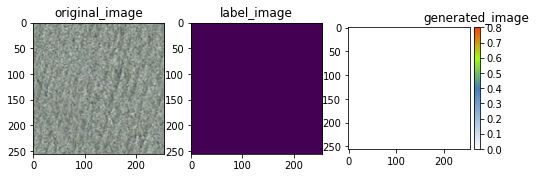

epoch : 14, time : 3600, loss : 0.004035230726003647


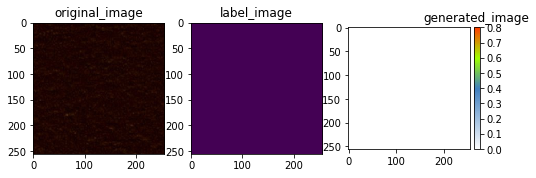

epoch : 14, time : 4000, loss : 0.0004995659692212939


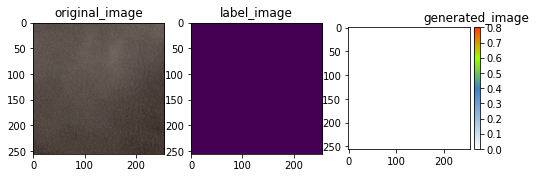

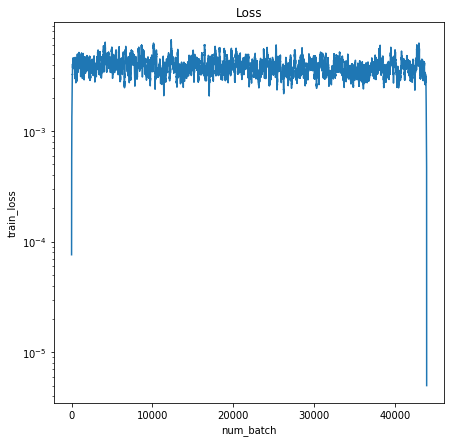

Epoch :14, Time : 4000 , Valid_Loss: 0.006243194453418255
epoch : 14, time : 4400, loss : 0.0004136296338401735


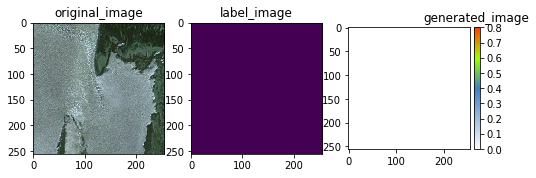

epoch : 14, time : 4800, loss : 0.0037619280628859997


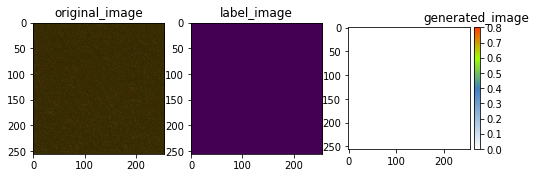

epoch : 15, time : 0, loss : 0.00074421102181077


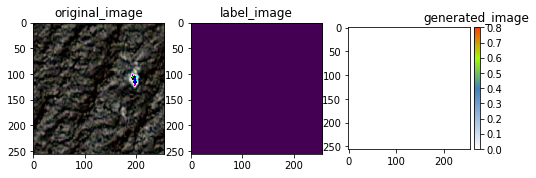

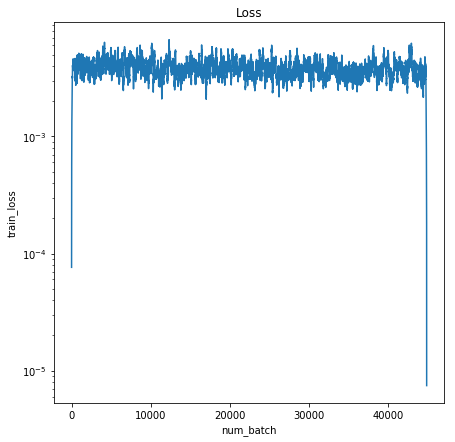

Epoch :15, Time : 0 , Valid_Loss: 0.005862822290509939
the learning rate turned to be   1.25e-05
epoch : 15, time : 400, loss : 0.0017055496573448181


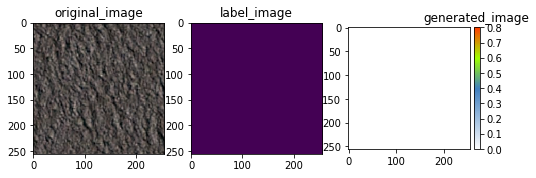

epoch : 15, time : 800, loss : 0.00016622590192127973


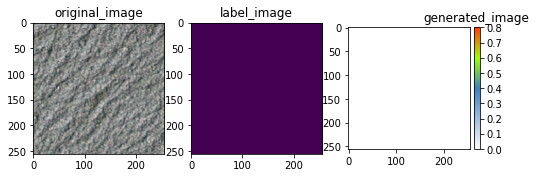

epoch : 15, time : 1200, loss : 0.0029543794225901365


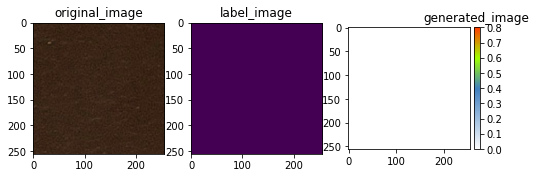

epoch : 15, time : 1600, loss : 0.003342173993587494


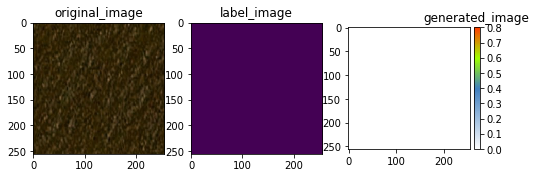

epoch : 15, time : 2000, loss : 0.0015720119699835777


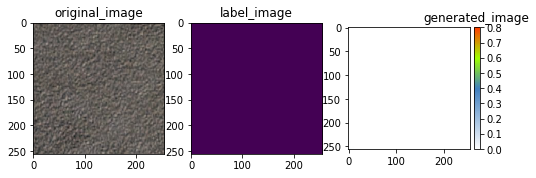

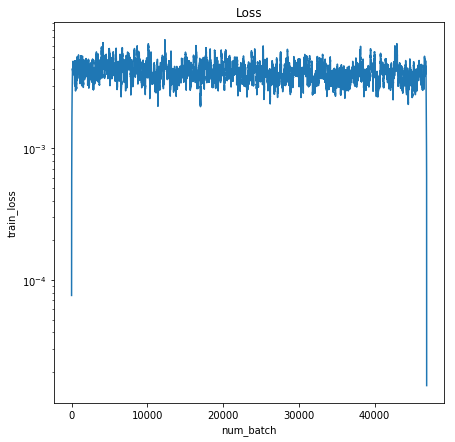

Epoch :15, Time : 2000 , Valid_Loss: 0.005495269317179918
epoch : 15, time : 2400, loss : 0.0004323034081608057


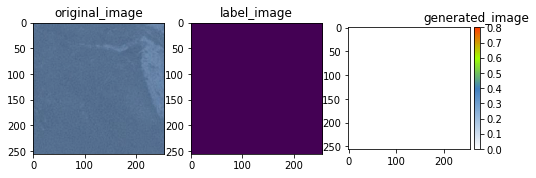

epoch : 15, time : 2800, loss : 0.00023323961067944765


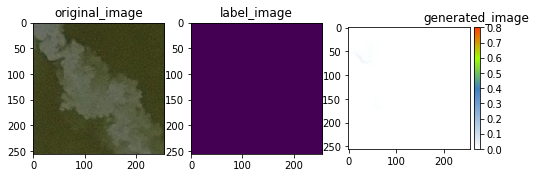

epoch : 15, time : 3200, loss : 0.0014871194725856185


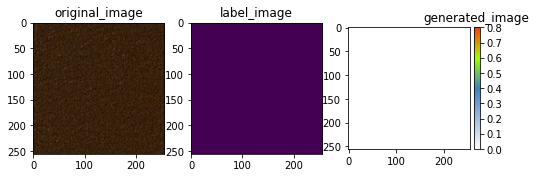

epoch : 15, time : 3600, loss : 0.0045583778992295265


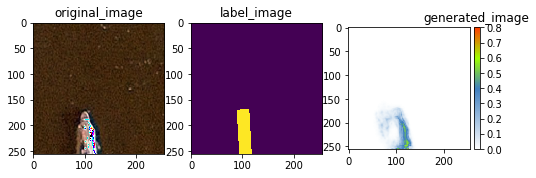

epoch : 15, time : 4000, loss : 0.0026194253005087376


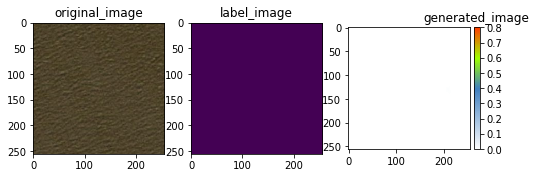

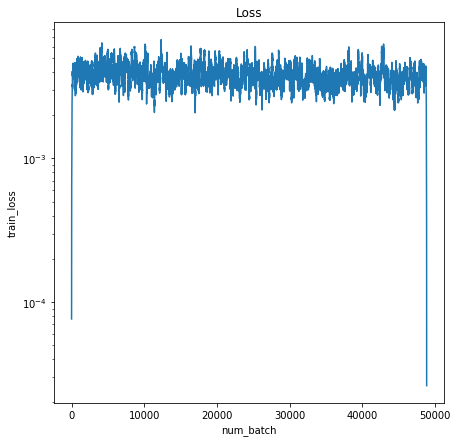

Epoch :15, Time : 4000 , Valid_Loss: 0.005434885621070862
epoch : 15, time : 4400, loss : 0.0007003023056313396


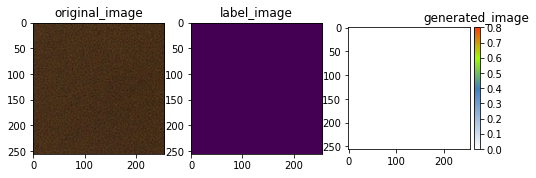

epoch : 15, time : 4800, loss : 0.006000651512295008


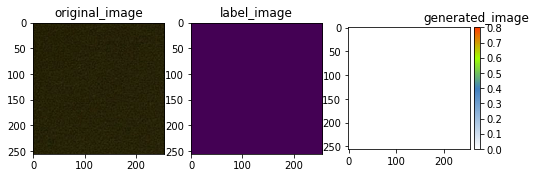

epoch : 16, time : 0, loss : 0.0030466984026134014


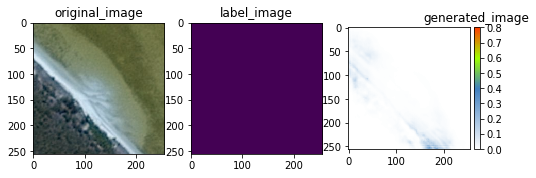

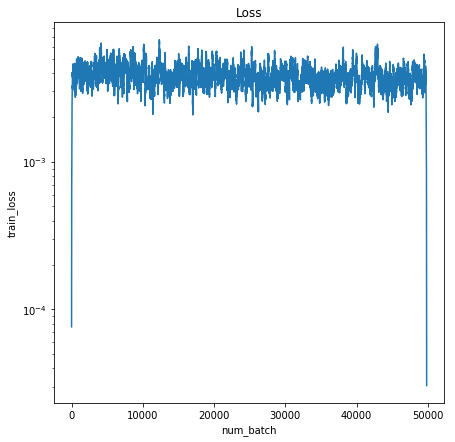

Epoch :16, Time : 0 , Valid_Loss: 0.005194613244384527
epoch : 16, time : 400, loss : 0.006715281400829554


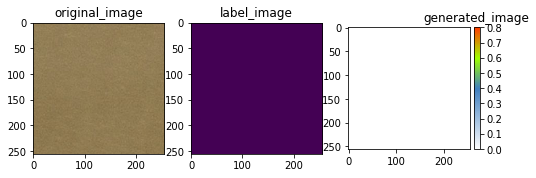

epoch : 16, time : 800, loss : 0.004924437962472439


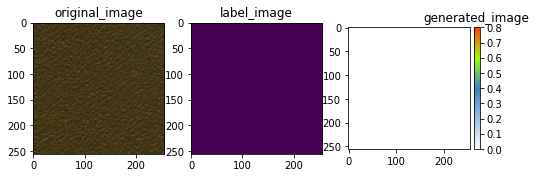

epoch : 16, time : 1200, loss : 0.0008752135327085853


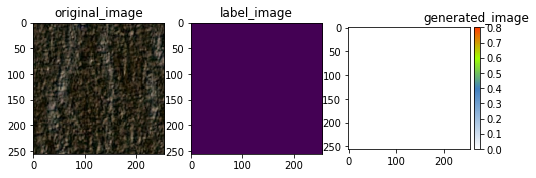

epoch : 16, time : 1600, loss : 0.0002654684940353036


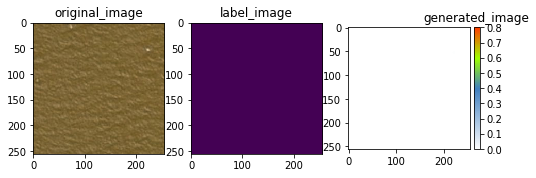

epoch : 16, time : 2000, loss : 0.003486539702862501


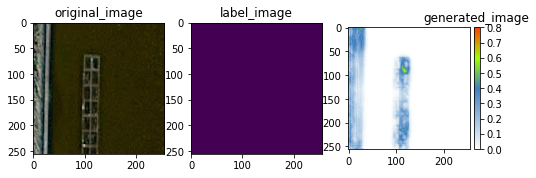

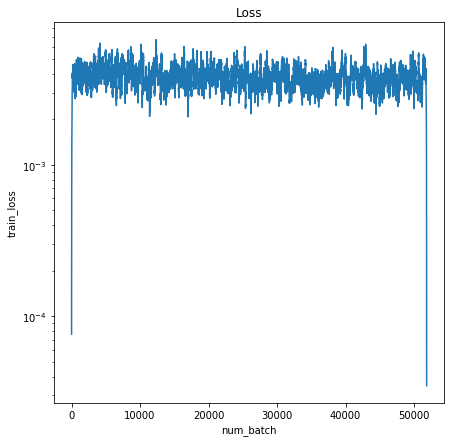

Epoch :16, Time : 2000 , Valid_Loss: 0.0062688179314136505
epoch : 16, time : 2400, loss : 0.0005305080558173358


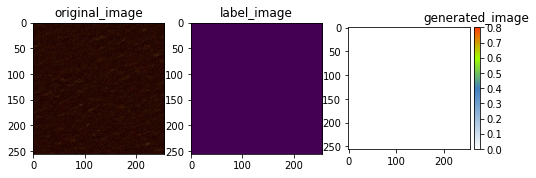

epoch : 16, time : 2800, loss : 0.0017162133008241653


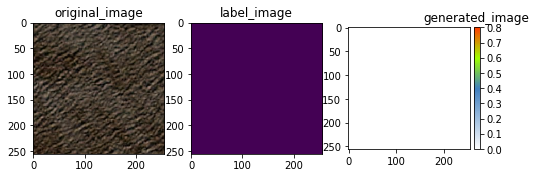

epoch : 16, time : 3200, loss : 0.0006700356607325375


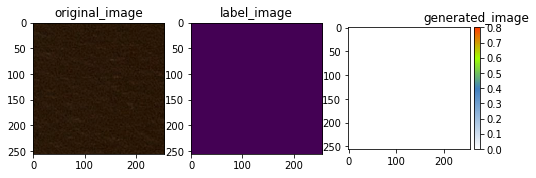

epoch : 16, time : 3600, loss : 0.002912383060902357


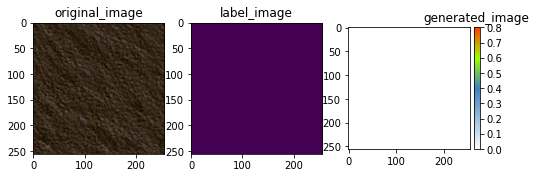

epoch : 16, time : 4000, loss : 0.0022371045779436827


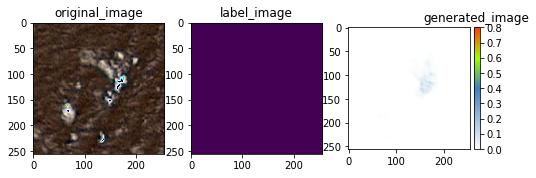

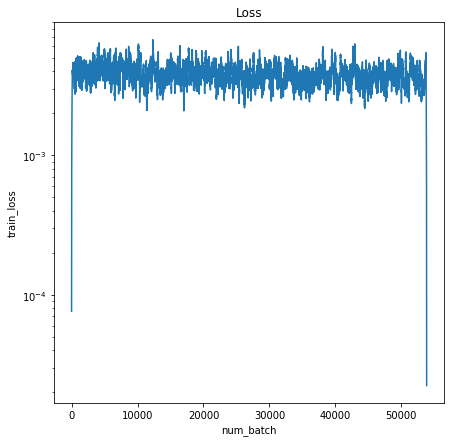

Epoch :16, Time : 4000 , Valid_Loss: 0.00616928655654192
epoch : 16, time : 4400, loss : 0.004373181611299515


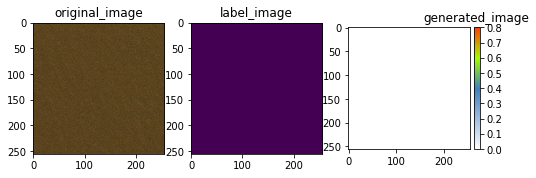

epoch : 16, time : 4800, loss : 0.0006393934600055218


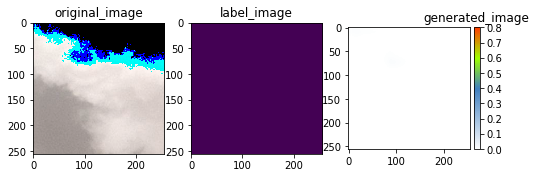

epoch : 17, time : 0, loss : 0.002530587138608098


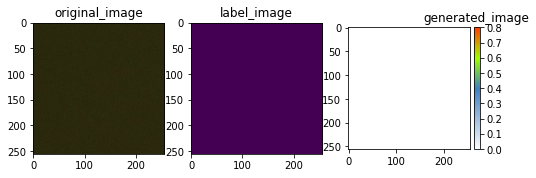

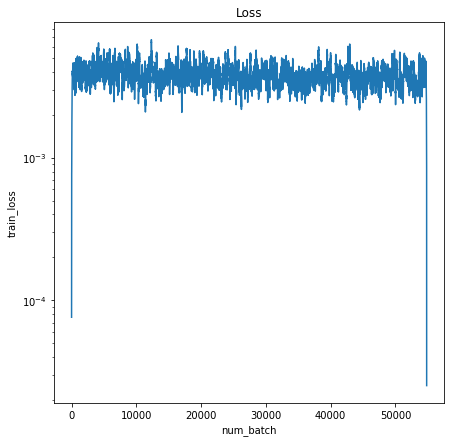

Epoch :17, Time : 0 , Valid_Loss: 0.005628429818898439
the learning rate turned to be   6.25e-06
epoch : 17, time : 400, loss : 0.004004830494523048


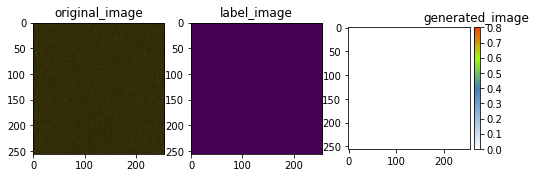

epoch : 17, time : 800, loss : 0.0015564357163384557


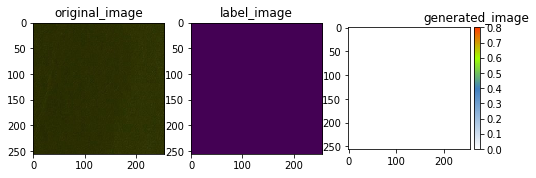

epoch : 17, time : 1200, loss : 0.007847605273127556


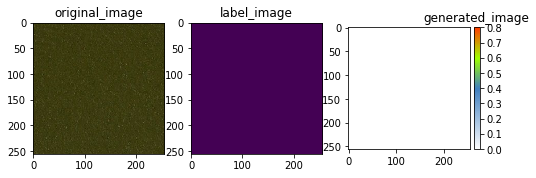

epoch : 17, time : 1600, loss : 0.00534792710095644


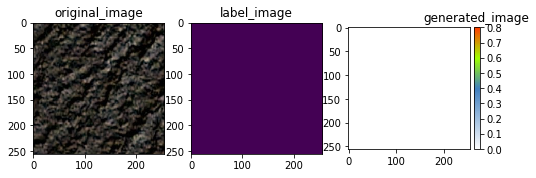

epoch : 17, time : 2000, loss : 0.0038942527025938034


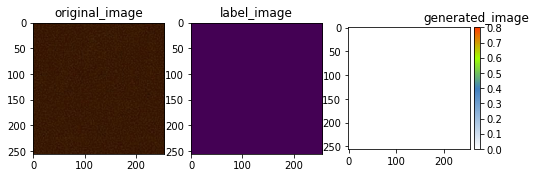

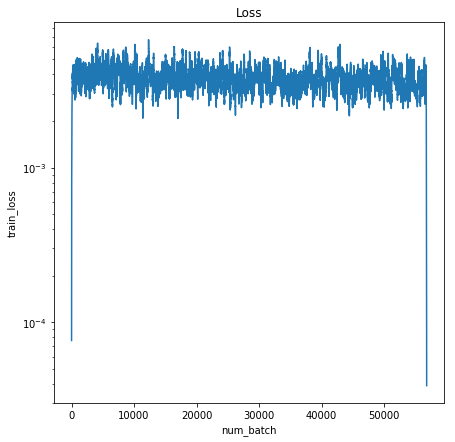

Epoch :17, Time : 2000 , Valid_Loss: 0.006163345649838448
epoch : 17, time : 2400, loss : 0.0021861218847334385


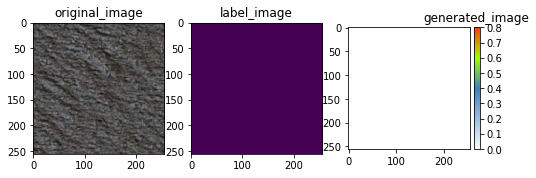

epoch : 17, time : 2800, loss : 0.0009891567751765251


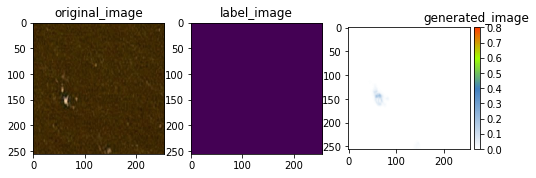

epoch : 17, time : 3200, loss : 0.003037643851712346


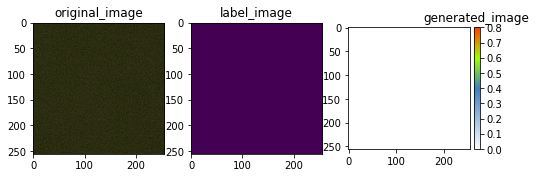

epoch : 17, time : 3600, loss : 0.027788231149315834


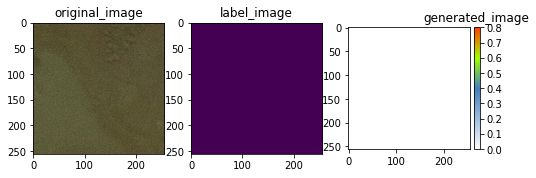

epoch : 17, time : 4000, loss : 0.0007760279113426805


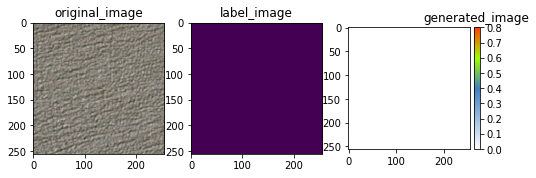

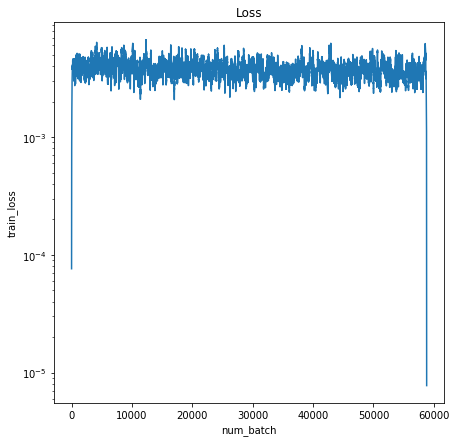

Epoch :17, Time : 4000 , Valid_Loss: 0.005714158993214369
epoch : 17, time : 4400, loss : 0.003270178334787488


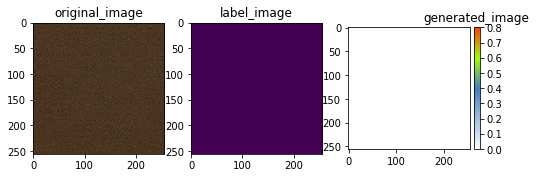

epoch : 17, time : 4800, loss : 0.0005352126318030059


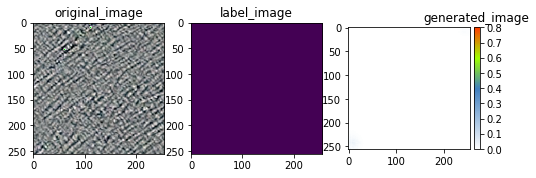

epoch : 18, time : 0, loss : 0.0022209524177014828


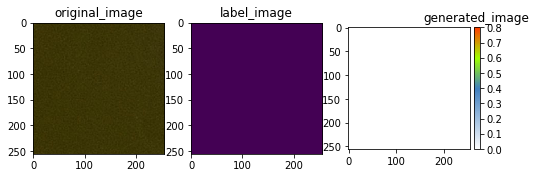

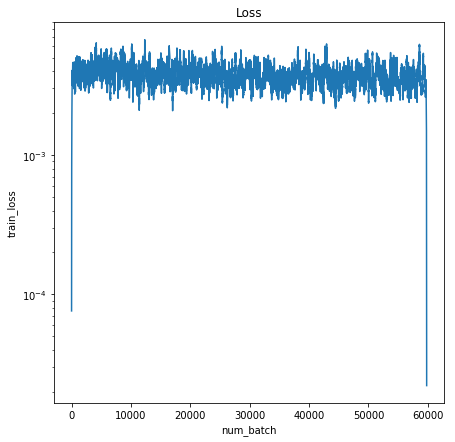

Epoch :18, Time : 0 , Valid_Loss: 0.005916724447160959
the learning rate turned to be   3.125e-06
epoch : 18, time : 400, loss : 0.00027306281845085323


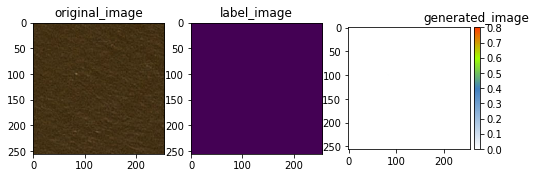

epoch : 18, time : 800, loss : 0.0029065704438835382


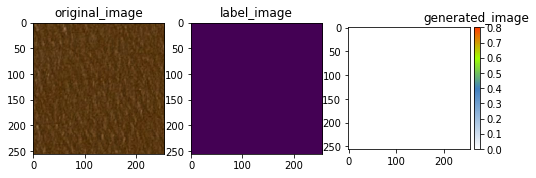

epoch : 18, time : 1200, loss : 0.008537513203918934


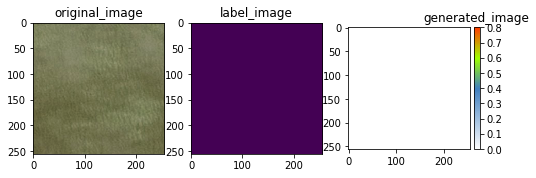

epoch : 18, time : 1600, loss : 0.0010531474836170673


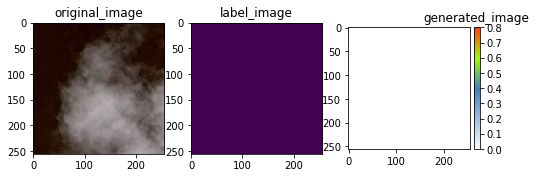

epoch : 18, time : 2000, loss : 0.0055235628969967365


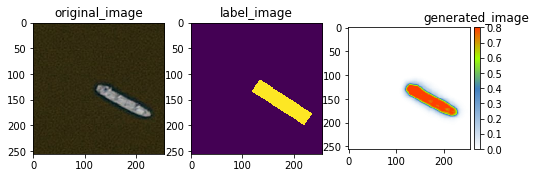

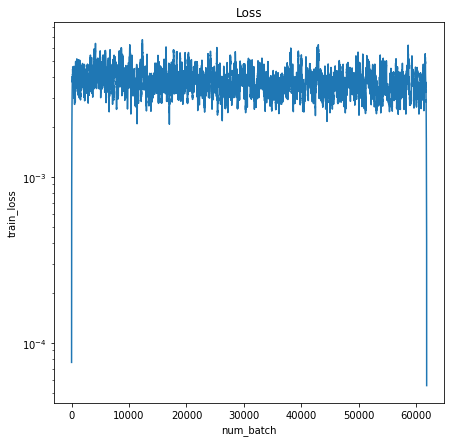

Epoch :18, Time : 2000 , Valid_Loss: 0.005932679865509272
epoch : 18, time : 2400, loss : 0.004915453959256411


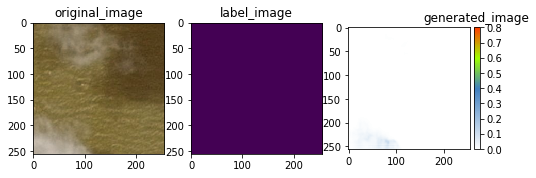

epoch : 18, time : 2800, loss : 0.014887864701449871


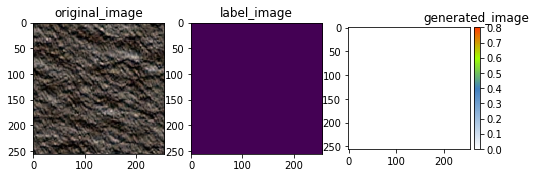

epoch : 18, time : 3200, loss : 0.001037095207720995


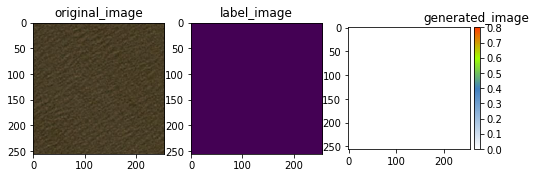

epoch : 18, time : 3600, loss : 0.00032336197909899056


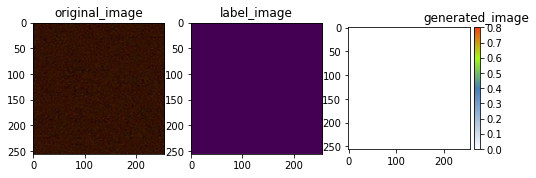

epoch : 18, time : 4000, loss : 0.002175557194277644


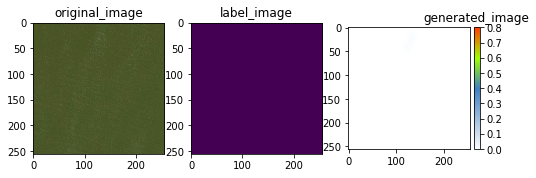

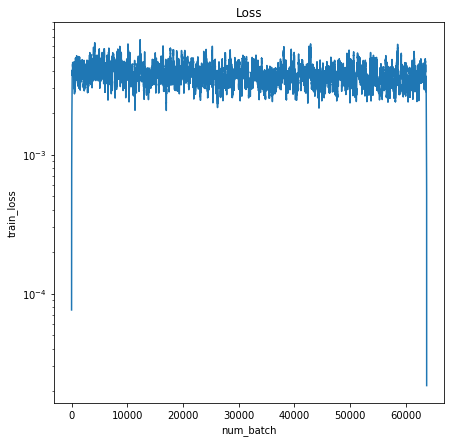

Epoch :18, Time : 4000 , Valid_Loss: 0.005185446701943874
epoch : 18, time : 4400, loss : 0.0017143844161182642


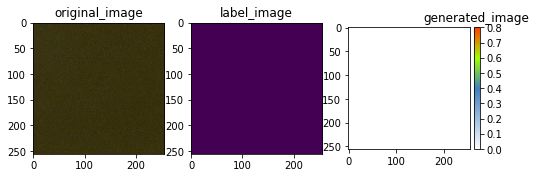

epoch : 18, time : 4800, loss : 0.0003199675411451608


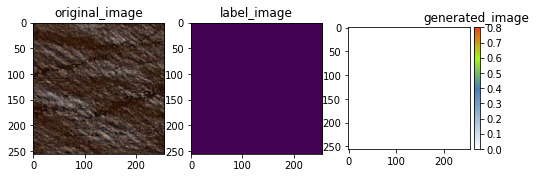

epoch : 19, time : 0, loss : 0.014762833714485168


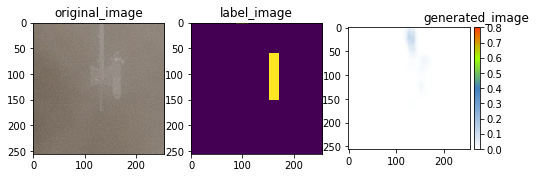

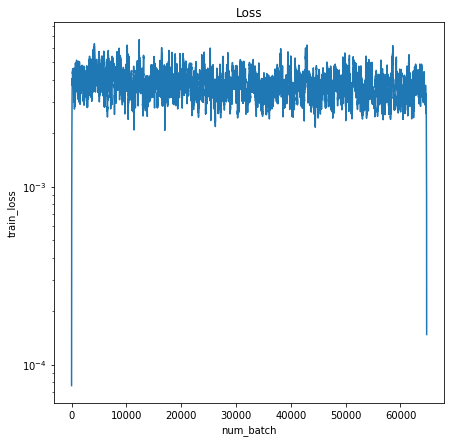

Epoch :19, Time : 0 , Valid_Loss: 0.005684738513082266
epoch : 19, time : 400, loss : 0.008504181168973446


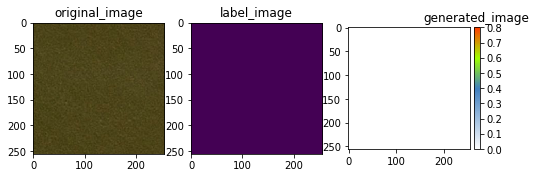

epoch : 19, time : 800, loss : 0.0008447715081274509


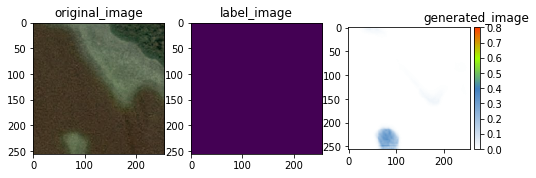

epoch : 19, time : 1200, loss : 0.0035360013134777546


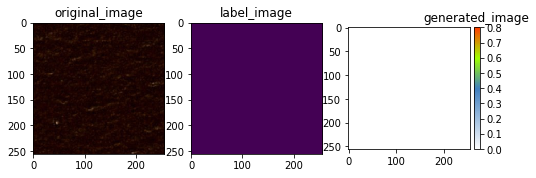

epoch : 19, time : 1600, loss : 0.002119559096172452


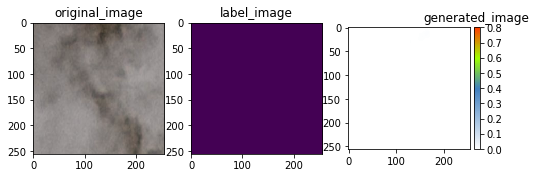

epoch : 19, time : 2000, loss : 0.00023902553948573768


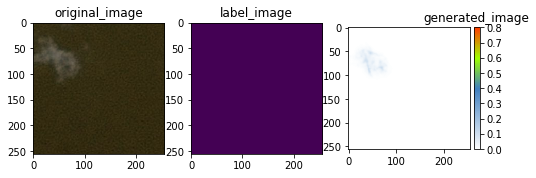

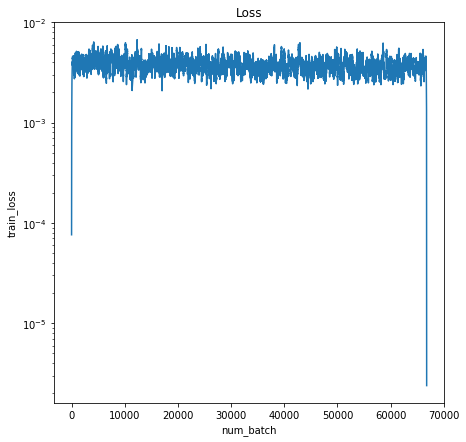

Epoch :19, Time : 2000 , Valid_Loss: 0.005321296397596598
epoch : 19, time : 2400, loss : 0.0007624810095876455


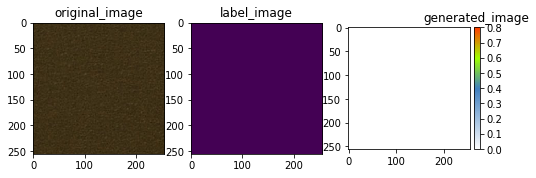

epoch : 19, time : 2800, loss : 0.003938404377549887


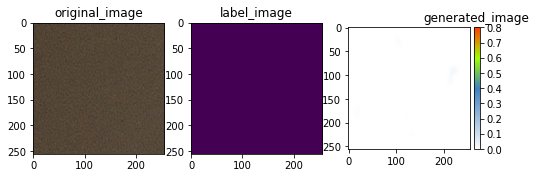

epoch : 19, time : 3200, loss : 0.00025138663477264345


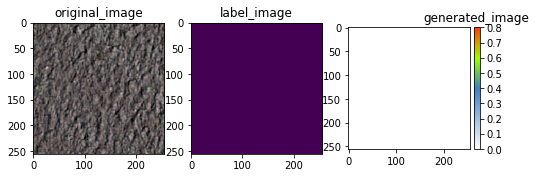

epoch : 19, time : 3600, loss : 0.00031914416467770934


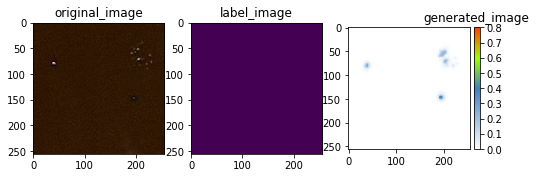

epoch : 19, time : 4000, loss : 0.0010199195239692926


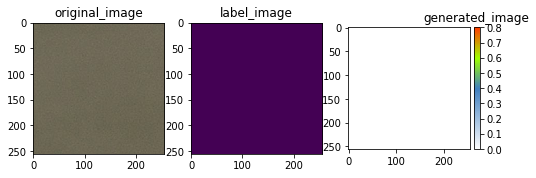

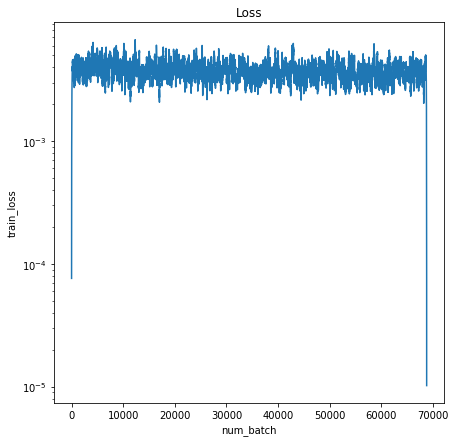

Epoch :19, Time : 4000 , Valid_Loss: 0.005771411117166281
epoch : 19, time : 4400, loss : 0.05495627969503403


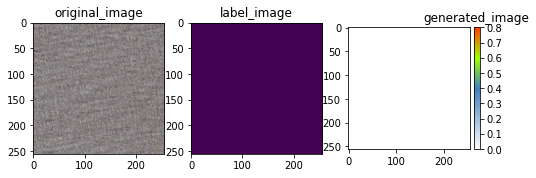

epoch : 19, time : 4800, loss : 0.00037823739694431424


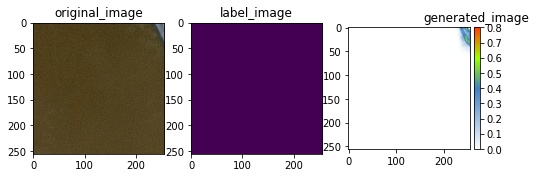

In [21]:
epoch = 20
file = open('./unet_random_brighness', 'w')
loss_record = []
last_valid_loss = 999999
for i in range(6,epoch):
    for _, (images,img_masks) in enumerate(train_batch):
        gen_optimizer.zero_grad()

        x = Variable(images.float()).cuda(0)
        y_ = Variable(img_masks.mean(dim=1,keepdim=True)).cuda(0)
        y = generator.forward(x).mean(dim=1,keepdim=True).cuda(0) 
        
        loss = recon_loss_func(y,y_)
        file.write(str(loss.data[0])+"\n")
        loss_record.append(loss.data[0])
        loss.backward()
        gen_optimizer.step()
        
       
        if _ % 400 ==0:
            print("epoch : {}, time : {}, loss : {}".format(i, _, loss.data[0]))
            v_utils.save_image(x.cpu().data[0],"./result/{}_{}_original_image.png".format(i,_))
            v_utils.save_image(y_.cpu().data[0],"./result/{}_{}_label_image.png".format(i,_))
            v_utils.save_image(y.cpu().data[0],"./result/{}_{}_gen_image.png".format(i,_))
            plt.figure(figsize=(8,15))
            plt.subplot(131)
            plt.imshow(np.array(x.cpu().data[0]*256,dtype=np.uint8).transpose())
            plt.title("original_image")
            plt.subplot(132)
            plt.imshow(np.array(y_.cpu().data[0]).mean(axis=0).transpose())
            plt.title("label_image")
            plt.subplot(133)
            a = np.array(y.cpu().data[0]).transpose().reshape(256,256)
            ax = plt.gca()
            im = ax.imshow(a, cmap=cmap,vmin=0,vmax=0.8) 
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)
            plt.title("generated_image")
            plt.show()
            torch.save(generator.state_dict(),'./u_model_0.002/u_net_{}_{}.pkl'.format(i,_))  
            if _ != 0  and _ != 3000:
                os.remove(last_file_path)
                
            last_file_path = './u_model_0.002/u_net_{}_{}.pkl'.format(i,_)
        if _ % 2000 == 0:
            plt.figure(figsize=(7,7)) 
            plt.plot(np.convolve(loss_record, v = np.ones(100)/100.0))
            plt.xlabel("num_batch") 
            plt.ylabel("train_loss")
            plt.yscale('log')
            plt.title("Loss")
            plt.show() 
            loss_list = [] 
            for k, (images, img_masks) in enumerate(valid_batch):
                x = Variable(images).cuda(0)
                y_ = Variable(img_masks.mean(dim=1,keepdim=True)).cuda(0)
                y = generator.forward(x).mean(dim=1,keepdim=True)
                loss_list.append(recon_loss_func(y,y_).data[0]) 
        
            valid_loss = np.array(loss_list).mean() 
            print("Epoch :{}, Time : {} , Valid_Loss: {}".format(i, _,valid_loss))
            if _ == 0 and last_valid_loss < valid_loss:
                lr /= 2
                gen_optimizer = torch.optim.Adam(generator.parameters(),lr=lr)
                print("the learning rate turned to be  ", lr)
            if _ == 0:
                last_valid_loss = valid_loss
                
                

            
            
        del x
        del y_
        del y
        gc.collect();
        
    

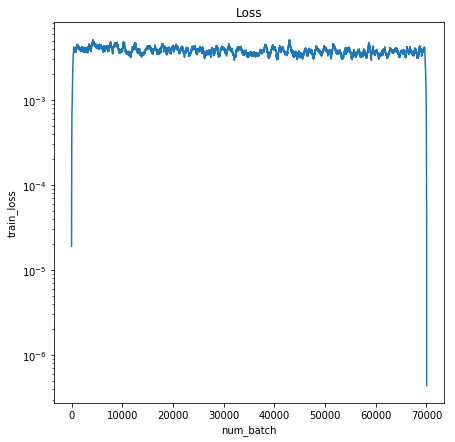

In [22]:
plt.figure(figsize=(7,7)) 
plt.plot(np.convolve(loss_record, v = np.ones(400)/400.0))
# plt.ylim(0.0005, 0.003)
plt.yscale("log")
plt.xlabel("num_batch") 
plt.ylabel("train_loss")
plt.title("Loss")
plt.show() 

In [23]:
del loss_record
gc.collect();

In [24]:
"""
test用データセット
"""
class AirbusTestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.image_paths = os.listdir(root_dir)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.image_paths[idx])
        image = cv2.imread(image_path)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image)
            #image -= image.mean(dim=1, keepdim=True).mean(dim=2,keepdim=True)
            #image /= image.view(3,-1).std(dim=1,keepdim=True).view(3,1,1) + 4e-1
            
        
        
        return image, self.image_paths[idx]

In [25]:

test_dataset = AirbusTestDataset(root_dir='../test/', transform=transforms.Compose([
                                            transforms.ToPILImage(),
                                            transforms.Resize(size=img_size),
                                            transforms.ToTensor(),
                                            # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
 ]))

test_batch = data.DataLoader(test_dataset, batch_size=BATCH_SIZE,
                            shuffle=True, num_workers=0)



In [26]:
# last_file_path = "./u_model_0.002/0831_u_net_bceloss_9_1200.pkl"
model = UnetGenerator(3,1,64).cuda(0)
model.load_state_dict(torch.load(last_file_path))


------Initiating U-Net------



In [19]:
model.eval()

UnetGenerator(
  (down_1): Sequential(
    (0): Sequential(
      (0): Conv2d (3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (2): LeakyReLU(0.2, inplace)
    )
    (1): Conv2d (64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  )
  (pool_1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (down_2): Sequential(
    (0): Sequential(
      (0): Conv2d (64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
      (2): LeakyReLU(0.2, inplace)
    )
    (1): Conv2d (128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
  )
  (pool_2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (down_3): Sequential(
    (0): Sequential(
      (0): Conv2d (128, 256, kernel_size=(3,

In [20]:
import gc 
from torch.nn import functional as F

In [27]:

#kaggleのページに書いてあった、無視すべき画像
ignore_images = ['13703f040.jpg',
                 '14715c06d.jpg',
                 '33e0ff2d5.jpg',
                 '4d4e09f2a.jpg',
                 '877691df8.jpg',
                 '8b909bb20.jpg',
                 'a8d99130e.jpg',
                 'ad55c3143.jpg',
                 'c8260c541.jpg',
                 'd6c7f17c7.jpg',
                 'dc3e7c901.jpg',
                 'e44dffe88.jpg',
                 'ef87bad36.jpg',
                 'f083256d8.jpg']

In [28]:
def test(th1, th2):
    df = pd.DataFrame({'ImageId': [], 'EncodedPixels1': [], 'EncodedPixels2': []})
    df = df[["ImageId", "EncodedPixels1", "EncodedPixels2"]]
    index=0
    count1 = 0 
    count2 = 0
    for _, (image, image_paths) in enumerate(test_batch):
        image = Variable(image).cuda(0)
        outputs = model(image).data.cpu().numpy()
        for img_name, out_img in zip(image_paths, outputs):
            if img_name in ignore_images:
                continue
            out_img = out_img.transpose(1,2,0)
            out_img = np.maximum(out_img, 0)
            out_img = np.minimum(out_img, 1)
            out_gray = np.mean(out_img, axis=2)
        
            max_pixel = 1
            _, out_thresh1 = cv2.threshold(out_gray, th1, max_pixel, cv2.THRESH_BINARY)
            _, out_thresh2 = cv2.threshold(out_gray, th2, max_pixel, cv2.THRESH_BINARY)
        
            out_thresh1 = cv2.resize(out_thresh1, (768, 768))
            rl1 = convert_runlength(out_thresh1)
            if rl1 != "":
                count1 += 1
            
            out_thresh2 = cv2.resize(out_thresh2, (768, 768))
            rl2 = convert_runlength(out_thresh2)
            if rl2 != "":
                count2 += 1
            
            df.loc[index] = [img_name, rl1, rl2] 
            if index % 5000 == 0:
                df_1 = df.copy() 
                df_2 = df.copy() 
                df_1 = df_1.rename(columns= {"EncodedPixels1": "EncodedPixels"})
                df_2 = df_2.rename(columns={"EncodedPixels2": "EncodedPixels"})
                df_1.to_csv('submission_bceloss_{}.csv'.format(th1), header=True, index=False,columns=["ImageId","EncodedPixels"])
                df_2.to_csv('submission_bceloss_{}.csv'.format(th2), header=True, index=False,columns=["ImageId","EncodedPixels"])
                print(index, "\tfiles saved")
                del df_1
                del df_2 
                gc.collect();

                # 使わない場合は省く
                
            index += 1
            
    df_1 = df.copy() 
    df_2 = df.copy() 
    df_1 = df_1.rename(columns= {"EncodedPixels1":"EncodedPixels"})
    df_2 = df_2.rename(columns= {"EncodedPixels2":"EncodedPixels"})
    df_1.to_csv('submission_bceloss_{}.csv'.format(th1), header=True, index=False, columns=['ImageId', 'EncodedPixels'])
    df_2.to_csv('submission_bceloss_{}.csv'.format(th2), header=True, index=False, columns=['ImageId', 'EncodedPixels'])

In [33]:
test(th1=0.6,th2=0.65)

0 	files saved
5000 	files saved
10000 	files saved
15000 	files saved
20000 	files saved
25000 	files saved
30000 	files saved
35000 	files saved
40000 	files saved
45000 	files saved
50000 	files saved
55000 	files saved
60000 	files saved
65000 	files saved
70000 	files saved
75000 	files saved
80000 	files saved
85000 	files saved


In [34]:
test(th1=0.7, th2=0.75)

0 	files saved
5000 	files saved
10000 	files saved
15000 	files saved
20000 	files saved
25000 	files saved
30000 	files saved
35000 	files saved
40000 	files saved
45000 	files saved
50000 	files saved
55000 	files saved
60000 	files saved
65000 	files saved
70000 	files saved
75000 	files saved
80000 	files saved
85000 	files saved


In [ ]:
test(th1=0.63,th2=0.64)

In [29]:
img_dataset =  AirbusTestDataset(root_dir='../test/', transform=transforms.Compose([
                                            transforms.ToPILImage(),
                                            transforms.Resize(size=img_size),
                                            transforms.ToTensor(),
                                            # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
 ]))

img_batch = data.DataLoader(img_dataset, batch_size=BATCH_SIZE//2,
                            shuffle=True, num_workers=0)


In [30]:
import matplotlib.colors as clr
from mpl_toolkits.axes_grid1 import make_axes_locatable
cdict3 = {'red':((0.0,1.0,1.0),
                 (0.5,0.25,0.25),
                 (1.0,1.0,1.0)),
          'green':((0.0,1.0,1.0),
                   (0.5,0.5,0.5),
                   (0.75,1.0,1.0),
                   (1.0,0.25,0.25)),
          'blue':((0.0,1.0,1.0),
                  (0.5,0.75,0.75),
                  (0.75,0.0,0.0),
                  (1.0,0.0,0.0))}
cmap = clr.LinearSegmentedColormap('cmap', cdict3)


In [32]:
for _, (images, img_path) in enumerate(img_batch):
    images = Variable(images)
    imgs = images.data.cpu().numpy()
    imgs2 = imgs.copy() 
    img2_tensor = torch.from_numpy(imgs2).cuda(0)
    temp = Variable(img2_tensor)
    outputs = model(temp).data.cpu().numpy() 
    # outputs = F.sigmoid(model(temp).data).cpu().numpy()
    imgs = imgs.transpose(0, 2,3,1)
    for img_name, out_img, org_img in zip(img_path, outputs, imgs):
            if img_name in ignore_images:
                continue
            out_img = out_img.transpose(1,2,0)
            plt.figure(figsize=(15,20))
            plt.subplot(141)
            plt.imshow(np.array(org_img*256, dtype=np.uint8))
            plt.title("original image")
            
            plt.subplot(142)
            ax = plt.gca()
            im = ax.imshow(out_img.reshape(256,256), cmap=cmap,vmin=0,vmax=0.6) 
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)
            plt.title("generated image")
            
            plt.subplot(143) 
            thres = np.where(out_img>0.5, 1,0)
            plt.imshow(thres.reshape(256,256)) 
            plt.title("thresh = 0.5")
            
            plt.subplot(144) 
            thres2 = np.where(out_img>0.7, 1, 0) 
            plt.imshow(thres2.reshape(256,256))
            plt.title("thres = 0.7")
            plt.tight_layout() 
            plt.show()
            
    

KeyboardInterrupt: 

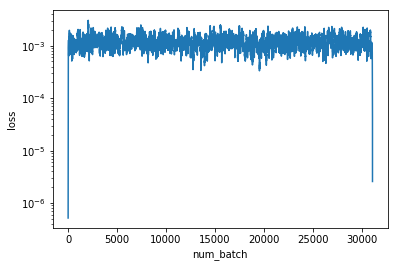

In [109]:
loss_rec_arr = np.array(loss_record) 
loss_rec_average = np.convolve(loss_rec_arr, v = np.ones(40)/40.)
plt.plot(loss_rec_average) 
plt.xlabel("num_batch") 
plt.ylabel("loss")
plt.yscale("log")
plt.show()